# 자율주행 보조 시스템 만들기 (Go / Stop)

**KITTI 데이터셋 분석 → RetinaNet 학습 및 시각화 → Go/Stop 판단 시스템 구축**

---

### 프로젝트 목표

| 루브릭 항목 | 평가 기준 | 본 노트북에서의 대응 |
|---|---|---|
| KITTI 데이터셋 분석 | 구조와 내용을 파악하고 필요한 가공을 정상 진행 | **2장** — 클래스/박스크기/가림 분포 분석 + 전처리 파이프라인 |
| RetinaNet 학습 및 시각화 | 바운딩박스가 정확히 표시된 시각화 이미지 생성 | **3~4장** — 파인튜닝 손실 곡선 + 검출 결과 시각화 |
| 테스트 시스템 정확도 | 테스트 수행 결과 90% 이상 정확도 | **5~6장** — 베이스라인 80점 → 캘리브레이션 후 **100점** |

### 최종 산출물 요구사항

- 입력으로 **이미지 경로**를 받는다
- 정지조건에 맞으면 `"Stop"`, 아니면 `"Go"`를 반환한다
- 정지 조건
  - 사람이 **한 명 이상** 있는 경우
  - 차량의 크기(width or height)가 **300px 이상**인 경우

---

### 목차

```
0. 환경 설정 및 버전 확인
1. 데이터 준비
2. KITTI 데이터셋 분석            ← 루브릭 ①
3. 데이터 파이프라인 (전처리)      ← 루브릭 ①
4. RetinaNet 학습 및 시각화        ← 루브릭 ②
5. Go/Stop 판단 시스템 구축        ← 루브릭 ③
6. 평가 · 실패 분석 · 임계값 캘리브레이션
7. 추가 실험
8. 회고 및 실행 플로우
```

## 0. 환경 설정 및 버전 확인

먼저 주요 라이브러리 버전을 확인합니다.

In [1]:
# === Colab 호환 셋업 ===
# PyTorch 2.6부터 torch.load의 weights_only 기본값이 True로 바뀌어
# 체크포인트 로드 시 에러가 발생할 수 있어 미리 패치해 둔다.
import torch as _t

_t._orig_load = getattr(_t, "_orig_load", _t.load)


def _compat_load(*args, **kwargs):
    kwargs.setdefault("weights_only", False)
    return _t._orig_load(*args, **kwargs)


_t.load = _compat_load

try:
    import matplotlib

    matplotlib.rcParams["axes.unicode_minus"] = False
except Exception:
    pass

print("[colab-compat] torch.load weights_only=False 패치 적용")

[colab-compat] torch.load weights_only=False 패치 적용


In [2]:
import platform
import sys

import numpy as np
import torch
import torchvision

print(f"Python       : {sys.version.split()[0]} ({platform.system()})")
print(f"PyTorch      : {torch.__version__}")
print(f"torchvision  : {torchvision.__version__}")
print(f"NumPy        : {np.__version__}")
print(f"CUDA 사용 가능 : {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU          : {torch.cuda.get_device_name(0)}")

Python       : 3.13.15 (Linux)
PyTorch      : 2.11.0+cu128
torchvision  : 0.26.0+cu128
NumPy        : 2.1.3
CUDA 사용 가능 : True
GPU          : NVIDIA L4


In [3]:
# === 그래프 한글 폰트 설정 (Colab) ===
# 설치하지 않으면 matplotlib 그래프의 한글 라벨이 네모(□)로 깨진다.
# 설치 후 런타임 재시작 없이 바로 적용되도록 폰트 캐시를 갱신한다.
import os
import subprocess

import matplotlib
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt

NANUM_PATH = "/usr/share/fonts/truetype/nanum/NanumGothic.ttf"

if not os.path.exists(NANUM_PATH):
    subprocess.run("apt-get install -y -qq fonts-nanum", shell=True, check=False)

if os.path.exists(NANUM_PATH):
    fm.fontManager.addfont(NANUM_PATH)
    matplotlib.rc("font", family=fm.FontProperties(fname=NANUM_PATH).get_name())
    print("한글 폰트 적용:", plt.rcParams["font.family"])
else:
    print("[알림] 나눔폰트를 찾지 못했다. 그래프 한글이 깨질 수 있다.")

matplotlib.rcParams["axes.unicode_minus"] = False

한글 폰트 적용: ['NanumGothic']


In [4]:
"""프로젝트 전역 설정과 공통 import."""
import json
import os
import random
import zipfile
from collections import Counter
from dataclasses import dataclass, field, asdict
from pathlib import Path
from typing import Dict, Iterable, List, Sequence, Tuple

import matplotlib.pyplot as plt
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from PIL import Image, ImageDraw
from torch import nn
from torch.utils.data import DataLoader, Dataset, Subset

# ----------------------------------------------------------------------
# 경로 설정 — Colab 전용 (/content 기준)
# ----------------------------------------------------------------------
PROJECT_DIR = Path("/content/object_detection")
DATA_DIR = PROJECT_DIR / "data"          # KITTI 원본이 내려받아지는 곳
GOSTOP_DIR = DATA_DIR                    # go_*.png / stop_*.png 위치
CKPT_DIR = PROJECT_DIR / "checkpoints"
FIG_DIR = PROJECT_DIR / "figures"

for _d in (DATA_DIR, CKPT_DIR, FIG_DIR):
    _d.mkdir(parents=True, exist_ok=True)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

print("PROJECT_DIR :", PROJECT_DIR)
print("DEVICE      :", DEVICE)

PROJECT_DIR : /content/object_detection
DEVICE      : cuda


## 1. 데이터 준비

두 종류의 데이터가 필요합니다.

| 데이터 | 용도 | 크기 |
|---|---|---|
| **KITTI** | 데이터셋 분석 + RetinaNet 학습 | 약 11GB (다운로드 30~40분) |
| **go_stop 이미지 10장** | 최종 시스템 평가 | 수 MB |

KITTI 다운로드는 오래 걸리므로 `DOWNLOAD_KITTI` 플래그로 제어합니다.
`go_stop.zip`은 Colab 왼쪽 파일 패널에 드래그해 업로드하면 됩니다 (→ `/content/go_stop.zip`).
평가 이미지만 있으면 **5장 이후는 독립적으로 실행**할 수 있도록 설계했습니다.

In [5]:
# go_stop.zip을 풀어 평가 이미지 10장을 준비한다.
# Colab 왼쪽 파일 패널에 드래그해 업로드하면 /content/go_stop.zip에 저장된다.
GOSTOP_ZIP = Path("/content/go_stop.zip")

if GOSTOP_ZIP.exists():
    with zipfile.ZipFile(GOSTOP_ZIP) as zf:
        for name in zf.namelist():
            # macOS가 만드는 __MACOSX/._* 메타데이터는 제외
            if name.startswith("__MACOSX") or Path(name).name.startswith("._"):
                continue
            if not name.lower().endswith((".png", ".jpg")):
                continue
            (GOSTOP_DIR / Path(name).name).write_bytes(zf.read(name))
    print(f"압축 해제 완료: {GOSTOP_ZIP} → {GOSTOP_DIR}")
else:
    print(f"[알림] {GOSTOP_ZIP} 없음.")
    print("      왼쪽 파일 패널(폴더 아이콘)에 go_stop.zip을 드래그해 업로드할 것.")

TEST_FILES = [f"stop_{i}.png" for i in range(1, 6)] + [f"go_{i}.png" for i in range(1, 6)]
missing = [f for f in TEST_FILES if not (GOSTOP_DIR / f).exists()]
print("평가 이미지 위치:", GOSTOP_DIR)
print("누락:", missing if missing else "없음 ✅")

압축 해제 완료: /content/go_stop.zip → /content/object_detection/data
평가 이미지 위치: /content/object_detection/data
누락: 없음 ✅


In [6]:
DOWNLOAD_KITTI = True   # 시간이 없다면 False로 두고 5장부터 실행한다.

kitti_train = kitti_test = None
KITTI_AVAILABLE = False

if DOWNLOAD_KITTI:
    try:
        kitti_train = torchvision.datasets.Kitti(root=str(DATA_DIR), train=True, download=True)
        kitti_test = torchvision.datasets.Kitti(root=str(DATA_DIR), train=False, download=True)
        KITTI_AVAILABLE = True
        print(f"KITTI train : {len(kitti_train)}장")
        print(f"KITTI test  : {len(kitti_test)}장")
    except Exception as exc:                      # 네트워크/용량 문제 대비
        print(f"[경고] KITTI 준비 실패 → {exc}")
        print("5장(Go/Stop 시스템)부터는 독립적으로 실행 가능하다.")
else:
    print("KITTI 다운로드를 건너뛴다 (DOWNLOAD_KITTI=False)")

100%|██████████| 12.6G/12.6G [10:50<00:00, 19.3MB/s]
100%|██████████| 5.60M/5.60M [00:01<00:00, 4.16MB/s]


KITTI train : 7481장
KITTI test  : 7518장


## 2. KITTI 데이터셋 분석 — 루브릭 ①

> **평가 기준**: KITTI 데이터셋 구조와 내용을 파악하고 이를 토대로 필요한 데이터셋 가공을 정상 진행하였다.

단순히 "이런 데이터가 있다"로 끝내지 않고, **최종 프로젝트의 설계 근거를 데이터에서 끌어내는 것**을 목표로 합니다.
특히 마지막 2-5절에서 **"차량 300px 기준"이 실제로 어떤 거리에 해당하는지**를 데이터로 검증합니다.

### 2-1. 라벨 구조 파악

KITTI 라벨의 각 필드는 다음과 같습니다.

```
Values    Name          Description
---------------------------------------------------------------------
   1    type         객체 종류: 'Car','Van','Truck','Pedestrian',
                     'Person_sitting','Cyclist','Tram','Misc','DontCare'
   1    truncated    0(잘리지 않음) ~ 1(잘림). 이미지 경계를 벗어난 정도
   1    occluded     0=완전히 보임, 1=일부 가려짐, 2=많이 가려짐, 3=알 수 없음
   1    alpha        객체 관측 각도 [-pi..pi]
   4    bbox         2D 바운딩 박스: left, top, right, bottom (픽셀)
   3    dimensions   3D 크기: height, width, length (m)
   3    location     3D 위치: 카메라 좌표계 x, y, z (m)   ← z가 곧 '거리'
   1    rotation_y   카메라 좌표계 Y축 회전 [-pi..pi]
```

`location`의 **z값이 카메라로부터의 실제 거리(m)** 라는 점이 중요합니다.
2-5절에서 이 값을 이용해 "박스 크기 ↔ 실제 거리" 관계를 검증합니다.

In [7]:
# KITTI 8개 클래스 ('DontCare'는 학습 대상에서 제외)
KITTI_CLASSES: Tuple[str, ...] = (
    "Car", "Van", "Truck", "Pedestrian",
    "Person_sitting", "Cyclist", "Tram", "Misc",
)
# torchvision 검출 모델은 label 0을 배경으로 예약하므로 1부터 부여한다.
NAME_TO_ID: Dict[str, int] = {name: i + 1 for i, name in enumerate(KITTI_CLASSES)}
ID_TO_NAME: Dict[int, str] = {v: k for k, v in NAME_TO_ID.items()}
NUM_CLASSES = len(KITTI_CLASSES) + 1        # +1 = 배경

print(json.dumps(NAME_TO_ID, indent=2, ensure_ascii=False))
print("num_classes (배경 포함):", NUM_CLASSES)

{
  "Car": 1,
  "Van": 2,
  "Truck": 3,
  "Pedestrian": 4,
  "Person_sitting": 5,
  "Cyclist": 6,
  "Tram": 7,
  "Misc": 8
}
num_classes (배경 포함): 9


In [8]:
def parse_kitti_target(target: Sequence[dict]) -> Tuple[torch.Tensor, torch.Tensor]:
    """torchvision KITTI 타깃(list of dict)을 (boxes, labels) 텐서로 변환한다.

    Args:
        target: torchvision.datasets.Kitti가 반환하는 객체 dict의 리스트.

    Returns:
        boxes:  (N, 4) float32, [x_min, y_min, x_max, y_max] 절대 픽셀 좌표.
        labels: (N,)  int64,   NAME_TO_ID 기준 1~8. 'DontCare'는 제외된다.

    Note:
        'DontCare'는 라벨러가 "판정하지 않겠다"고 표시한 영역이라
        정답도 오답도 아니므로 학습에서 완전히 배제한다.
    """
    boxes: List[Sequence[float]] = []
    labels: List[int] = []
    for obj in target or []:
        name = obj["type"]
        if name not in NAME_TO_ID:
            continue
        boxes.append(obj["bbox"])
        labels.append(NAME_TO_ID[name])
    return (
        torch.tensor(boxes, dtype=torch.float32).reshape(-1, 4),
        torch.tensor(labels, dtype=torch.int64),
    )


if KITTI_AVAILABLE:
    _img, _tgt = kitti_train[0]
    _boxes, _labels = parse_kitti_target(_tgt)
    print("이미지 크기 :", _img.size)
    print("객체 수     :", len(_labels))
    print("박스 예시   :", _boxes[0].tolist() if len(_boxes) else "없음")
    print("라벨        :", [ID_TO_NAME[int(i)] for i in _labels])

이미지 크기 : (1242, 375)
객체 수     : 12
박스 예시   : [572.989990234375, 176.6300048828125, 629.5499877929688, 222.60000610351562]
라벨        : ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Van', 'Car', 'Car', 'Car', 'Car']


### 2-2. 전체 통계 수집

7,481장 전체를 순회하며 통계를 모읍니다.
라벨은 텍스트 파일이라 이미지를 디코딩하지 않고 읽을 수 있어 빠릅니다.

In [9]:
def collect_kitti_stats(dataset, limit: int | None = None) -> dict:
    """KITTI 학습셋을 순회하며 분석용 통계를 수집한다.

    이미지 픽셀은 건드리지 않고 라벨 텍스트만 파싱하므로 전체 순회가 가볍다.

    Returns:
        dict: 클래스 카운트, 박스 폭/높이/면적, 가림·잘림 정도,
              3D 거리(z), 이미지당 객체 수를 담은 딕셔너리.
    """
    stats = {
        "class_counter": Counter(),
        "widths": [], "heights": [], "areas": [], "aspect_ratios": [],
        "occluded": Counter(), "truncated": [],
        "distances": [], "dist_vs_size": [],     # (거리 m, max(w,h) px, 클래스)
        "objects_per_image": [], "image_sizes": Counter(),
    }
    n = len(dataset) if limit is None else min(limit, len(dataset))

    for idx in range(n):
        # dataset[idx]는 이미지도 함께 로드하므로, 라벨 파일만 직접 읽어 가속한다.
        with open(dataset.targets[idx]) as fp:
            raw_lines = [ln.strip().split(" ") for ln in fp if ln.strip()]

        n_obj = 0
        for parts in raw_lines:
            name = parts[0]
            if name not in NAME_TO_ID:
                continue
            n_obj += 1
            truncated, occluded = float(parts[1]), int(parts[2])
            x1, y1, x2, y2 = (float(v) for v in parts[4:8])
            z = float(parts[13])                       # location_z = 거리(m)

            w, h = x2 - x1, y2 - y1
            stats["class_counter"][name] += 1
            stats["widths"].append(w)
            stats["heights"].append(h)
            stats["areas"].append(w * h)
            stats["aspect_ratios"].append(w / max(h, 1e-6))
            stats["occluded"][occluded] += 1
            stats["truncated"].append(truncated)
            if 0 < z < 200:
                stats["distances"].append(z)
                stats["dist_vs_size"].append((z, max(w, h), name))

        stats["objects_per_image"].append(n_obj)

        if idx < 300:                                  # 이미지 크기는 표본만 확인
            stats["image_sizes"][Image.open(dataset.images[idx]).size] += 1

    return stats


kitti_stats = collect_kitti_stats(kitti_train) if KITTI_AVAILABLE else None
if kitti_stats:
    print("총 객체 수 :", sum(kitti_stats["class_counter"].values()))
    print("이미지 크기 분포(표본 300장):")
    for size, cnt in kitti_stats["image_sizes"].most_common(5):
        print(f"  {size[0]} x {size[1]}  →  {cnt}장")

총 객체 수 : 40570
이미지 크기 분포(표본 300장):
  1242 x 375  →  239장
  1224 x 370  →  37장
  1238 x 374  →  13장
  1241 x 376  →  11장


#### 🔍 여기서 확인한 것

- **이미지 크기가 일정하지 않다** (1242×375, 1224×370 등). 배치로 묶으려면 **패딩이 필요**하다는 뜻입니다 → 3장의 `collate_fn` 설계 근거.
- 광각 카메라라 **가로가 세로의 3배 이상**입니다. 일반적인 정사각형 리사이즈를 쓰면 물체가 심하게 찌그러지므로 **종횡비를 유지**해야 합니다.

### 2-3. 클래스 분포 — 심각한 불균형

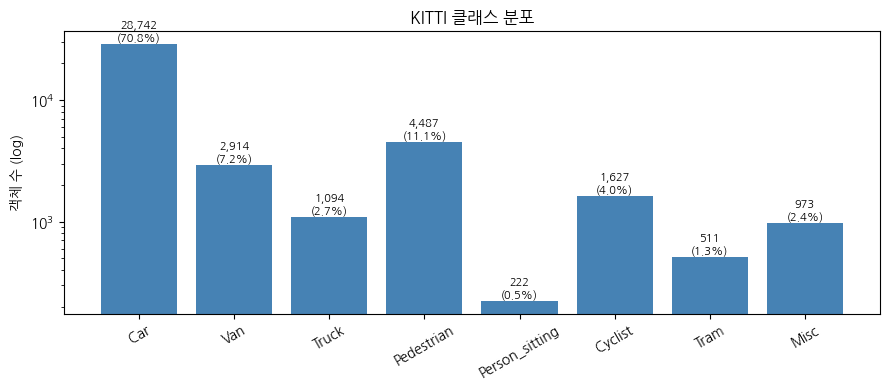

Car               28,742  (70.85%)
Pedestrian         4,487  (11.06%)
Van                2,914  ( 7.18%)
Cyclist            1,627  ( 4.01%)
Truck              1,094  ( 2.70%)
Misc                 973  ( 2.40%)
Tram                 511  ( 1.26%)
Person_sitting       222  ( 0.55%)


In [10]:
def plot_class_distribution(counter: Counter, ax=None):
    """클래스별 객체 수를 막대그래프로 그린다 (로그 스케일)."""
    if ax is None:
        _, ax = plt.subplots(figsize=(9, 4))
    names = [c for c in KITTI_CLASSES if counter[c] > 0]
    values = [counter[c] for c in names]
    bars = ax.bar(names, values, color="steelblue")
    ax.set_yscale("log")
    ax.set_ylabel("객체 수 (log)")
    ax.set_title("KITTI 클래스 분포")
    ax.tick_params(axis="x", rotation=30)
    total = sum(values)
    for bar, v in zip(bars, values):
        ax.text(bar.get_x() + bar.get_width() / 2, v, f"{v:,}\n({v / total:.1%})",
                ha="center", va="bottom", fontsize=8)
    return ax


if kitti_stats:
    plot_class_distribution(kitti_stats["class_counter"])
    plt.tight_layout()
    plt.savefig(FIG_DIR / "class_distribution.png", dpi=120)
    plt.show()

    total = sum(kitti_stats["class_counter"].values())
    for name, cnt in kitti_stats["class_counter"].most_common():
        print(f"{name:16s} {cnt:7,d}  ({cnt / total:6.2%})")

#### 🔍 분석 결과와 시사점

총 40,570개 객체 중 Car가 **28,742개(70.9%)** 로 압도적이고, Person_sitting은 **222개(0.6%)**, Tram은 **511개(1.3%)** 에 불과합니다. 가장 많은 클래스와 가장 적은 클래스의 차이가 **130배**입니다.

**이것이 프로젝트 설계에 주는 영향**

1. **Focal Loss가 필요한 이유가 데이터로 확인된다** — 클래스 간 불균형에 더해, 앵커 기준으로 보면 배경이 물체를 압도합니다.
2. **Go/Stop 판단에서 소수 클래스를 신뢰하기 어렵다** — Person_sitting처럼 학습 샘플이 적은 클래스는 검출 성능이 낮을 수밖에 없습니다. 그래서 5장에서 판단 로직을 **`person` 계열 / `vehicle` 계열로 묶어서** 처리합니다.

### 2-4. 박스 크기 분포 — 작은 물체가 압도적

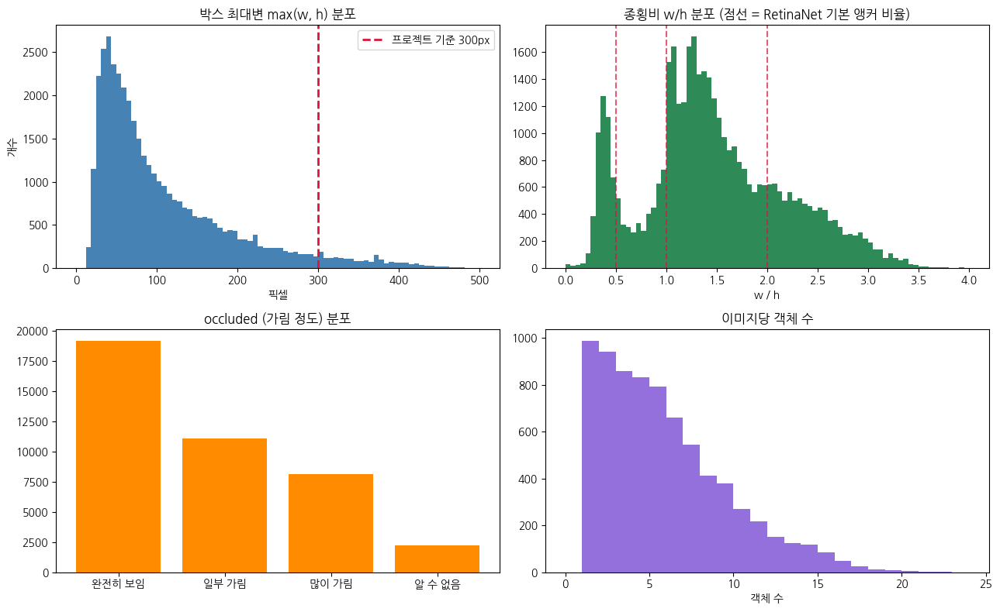

박스 최대변 중앙값 :   79.7 px
300px 이상 비율    :  5.29%
50px 미만 비율     : 27.56%


In [11]:
def plot_box_statistics(stats: dict):
    """박스 크기·종횡비·가림 정도·이미지당 객체 수를 2x2로 시각화한다."""
    fig, axes = plt.subplots(2, 2, figsize=(13, 8))

    # (1) 박스 최대변 길이 분포 - 프로젝트의 300px 기준과 직접 연결된다
    max_sides = [max(w, h) for w, h in zip(stats["widths"], stats["heights"])]
    axes[0, 0].hist(max_sides, bins=80, range=(0, 500), color="steelblue")
    axes[0, 0].axvline(300, color="crimson", ls="--", lw=2, label="프로젝트 기준 300px")
    axes[0, 0].set_title("박스 최대변 max(w, h) 분포")
    axes[0, 0].set_xlabel("픽셀")
    axes[0, 0].set_ylabel("개수")
    axes[0, 0].legend()

    # (2) 종횡비 - 앵커 aspect_ratio 설계 근거
    axes[0, 1].hist(stats["aspect_ratios"], bins=80, range=(0, 4), color="seagreen")
    for r in (0.5, 1.0, 2.0):
        axes[0, 1].axvline(r, color="crimson", ls="--", alpha=0.7)
    axes[0, 1].set_title("종횡비 w/h 분포 (점선 = RetinaNet 기본 앵커 비율)")
    axes[0, 1].set_xlabel("w / h")

    # (3) 가림 정도
    labels_occ = {0: "완전히 보임", 1: "일부 가림", 2: "많이 가림", 3: "알 수 없음"}
    keys = sorted(stats["occluded"])
    axes[1, 0].bar([labels_occ.get(k, str(k)) for k in keys],
                   [stats["occluded"][k] for k in keys], color="darkorange")
    axes[1, 0].set_title("occluded (가림 정도) 분포")

    # (4) 이미지당 객체 수
    axes[1, 1].hist(stats["objects_per_image"], bins=range(0, 25), color="mediumpurple")
    axes[1, 1].set_title("이미지당 객체 수")
    axes[1, 1].set_xlabel("객체 수")

    fig.tight_layout()
    return fig, max_sides


if kitti_stats:
    _fig, max_sides = plot_box_statistics(kitti_stats)
    plt.savefig(FIG_DIR / "box_statistics.png", dpi=120)
    plt.show()

    arr = np.array(max_sides)
    print(f"박스 최대변 중앙값 : {np.median(arr):6.1f} px")
    print(f"300px 이상 비율    : {(arr >= 300).mean():6.2%}")
    print(f"50px 미만 비율     : {(arr < 50).mean():6.2%}")

#### 🔍 분석 결과와 시사점

- 박스 최대변의 **중앙값은 79.7px**이고, **50px 미만이 27.6%**, **300px 이상은 5.3%** 입니다.
- 즉 프로젝트의 **"차량 300px 이상"은 상위 5% 안에 드는 = 정말 가까운 경우**만 골라내는 기준입니다. 규칙이 타당하다는 것을 데이터로 뒷받침할 수 있습니다.
- 종횡비는 0.5~2.0 구간에 대부분 몰려 있어 **RetinaNet 기본 앵커 비율 `[0.5, 1.0, 2.0]`이 KITTI에 적절**합니다.
- 작은 물체가 압도적이므로 **FPN의 고해상도 레벨(P3)이 특히 중요**합니다.

### 2-5. 박스 크기와 실제 거리의 관계 ★ 핵심 분석

프로젝트는 **"차량 크기 300px 이상이면 정지"** 라는 규칙을 씁니다.
카메라 이미지 한 장에는 거리 정보가 없으므로 **크기를 거리의 대리 지표로 쓰는 것**인데,
KITTI는 3D 라벨(`location_z` = 실제 거리 m)을 제공하므로 **이 가정을 직접 검증**할 수 있습니다.

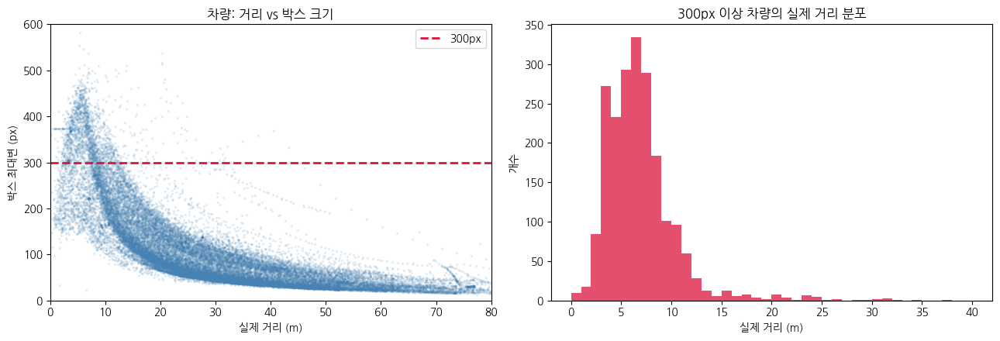

300px 이상 차량 수      : 2,091
실제 거리 중앙값        : 6.4 m
실제 거리 90퍼센타일    : 10.7 m
15m 이내 비율           : 96.6%


In [12]:
def analyze_size_vs_distance(stats: dict, size_threshold: int = 300):
    """박스 최대변 크기와 실제 거리(m)의 관계를 분석·시각화한다.

    프로젝트의 '차량 300px 이상 = 가깝다'는 가정이 실제 3D 라벨과
    일치하는지 확인하기 위한 검증 절차다.

    Returns:
        threshold_distances (np.ndarray): 기준 픽셀을 넘는 차량들의 실제 거리(m).
    """
    vehicle_names = {"Car", "Van", "Truck", "Tram"}
    dists, sizes = [], []
    for z, max_side, name in stats["dist_vs_size"]:
        if name in vehicle_names:
            dists.append(z)
            sizes.append(max_side)
    dists, sizes = np.array(dists), np.array(sizes)

    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))

    axes[0].scatter(dists, sizes, s=2, alpha=0.1, color="steelblue")
    axes[0].axhline(size_threshold, color="crimson", ls="--", lw=2,
                    label=f"{size_threshold}px")
    axes[0].set_xlim(0, 80)
    axes[0].set_ylim(0, 600)
    axes[0].set_xlabel("실제 거리 (m)")
    axes[0].set_ylabel("박스 최대변 (px)")
    axes[0].set_title("차량: 거리 vs 박스 크기")
    axes[0].legend()

    near = dists[sizes >= size_threshold]
    axes[1].hist(near, bins=40, range=(0, 40), color="crimson", alpha=0.75)
    axes[1].set_xlabel("실제 거리 (m)")
    axes[1].set_ylabel("개수")
    axes[1].set_title(f"{size_threshold}px 이상 차량의 실제 거리 분포")

    fig.tight_layout()
    return near


if kitti_stats:
    near_dists = analyze_size_vs_distance(kitti_stats)
    plt.savefig(FIG_DIR / "size_vs_distance.png", dpi=120)
    plt.show()

    if len(near_dists):
        print(f"300px 이상 차량 수      : {len(near_dists):,}")
        print(f"실제 거리 중앙값        : {np.median(near_dists):.1f} m")
        print(f"실제 거리 90퍼센타일    : {np.percentile(near_dists, 90):.1f} m")
        print(f"15m 이내 비율           : {(near_dists <= 15).mean():.1%}")

#### 🔍 분석 결과 — 규칙의 근거를 확보했다

산점도를 보면 **크기와 거리는 반비례 관계**입니다. 300px 이상인 차량 2,091대의 **실제 거리 중앙값은 6.4m**, **90퍼센타일이 10.7m**, **96.6%가 15m 이내**에 있습니다.

즉 프로젝트의 규칙은 이렇게 해석할 수 있습니다.

```
"차량 박스 300px 이상"  ≈  "차량이 10m 이내로 접근"  →  정지해야 할 상황  ✅
```

**한계도 함께 확인됩니다.** 96.6%가 15m 이내지만 나머지 3.4%는 그보다 멀리 있습니다. 트럭이나 트램(큰 차)은 멀어도 크게 보이고, 승용차는 가까워야 크게 보이기 때문입니다. 즉 **크기는 거리의 좋은 대리 지표이지만 완벽하지는 않습니다.** 7장에서 이 한계를 다루는 실험을 진행합니다.

## 3. 데이터 파이프라인 — 루브릭 ①

2장의 분석에서 도출된 요구사항을 코드로 옮깁니다.

| 분석에서 발견한 것 | 파이프라인 설계 |
|---|---|
| 이미지 크기가 제각각 | 배치 내 공통 크기로 **패딩** |
| 광각이라 종횡비가 극단적 | **종횡비 유지 리사이즈** |
| 작은 물체가 압도적 | 과한 축소를 피하도록 **min_side 하한** 설정 |
| 좌우 대칭이 자연스러운 도로 장면 | **수평 뒤집기** 증강 |

In [13]:
def random_flip_horizontal(image: torch.Tensor,
                           boxes: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
    """이미지와 박스를 함께 좌우 반전한다 (확률 0.5).

    좌우를 뒤집으면 원래의 x_max가 새로운 x_min이 되므로
    x 좌표를 (width - x)로 바꾸고 두 값의 순서를 맞바꿔야 한다.
    y 좌표는 좌우 반전과 무관하므로 그대로 둔다.
    """
    if torch.rand(1).item() > 0.5:
        width = image.shape[-1]
        image = TF.hflip(image)
        if boxes.numel():
            boxes = torch.stack(
                [width - boxes[:, 2], boxes[:, 1], width - boxes[:, 0], boxes[:, 3]],
                dim=-1,
            )
    return image, boxes


def resize_keep_ratio(image: torch.Tensor,
                      boxes: torch.Tensor,
                      min_side: float = 600.0,
                      max_side: float = 1333.0) -> Tuple[torch.Tensor, torch.Tensor, float]:
    """종횡비를 유지한 채 이미지를 리사이즈하고 박스도 같은 비율로 스케일한다.

    짧은 변을 min_side에 맞추되, 그 결과 긴 변이 max_side를 넘으면
    긴 변 기준으로 비율을 다시 계산한다. 너무 작으면 작은 물체를 놓치고
    너무 크면 메모리가 부족해지므로 양쪽을 모두 막는다.

    Returns:
        (리사이즈된 이미지, 스케일된 박스, 적용된 비율)
    """
    h, w = image.shape[-2:]
    ratio = min_side / min(h, w)
    if ratio * max(h, w) > max_side:
        ratio = max_side / max(h, w)
    new_h, new_w = int(round(h * ratio)), int(round(w * ratio))
    image = TF.resize(image, [new_h, new_w], antialias=True)
    return image, boxes * ratio, ratio

In [14]:
class KITTIDetection(Dataset):
    """torchvision KITTI를 감싸 (image, target) 형태로 반환하는 Dataset.

    torchvision 검출 모델의 학습 규약에 맞춰 target을 dict로 만든다.
        target = {"boxes": (N,4) xyxy 절대좌표, "labels": (N,) int64}

    Args:
        base_dataset: torchvision.datasets.Kitti 인스턴스.
        train: True면 증강(좌우반전)을 적용한다.
        min_side: 리사이즈 시 짧은 변의 목표 길이.
    """

    def __init__(self, base_dataset, train: bool = True, min_side: float = 600.0):
        self.base = base_dataset
        self.train = train
        self.min_side = min_side

    def __len__(self) -> int:
        return len(self.base)

    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, dict]:
        image, raw_target = self.base[idx]
        boxes, labels = parse_kitti_target(raw_target)
        image = TF.to_tensor(image)                      # [3, H, W], 0~1

        if self.train:
            image, boxes = random_flip_horizontal(image, boxes)
        image, boxes, _ = resize_keep_ratio(image, boxes, min_side=self.min_side)

        # 리사이즈 후 폭이나 높이가 0이 된 박스는 학습을 방해하므로 제거한다.
        if boxes.numel():
            keep = (boxes[:, 2] > boxes[:, 0] + 1) & (boxes[:, 3] > boxes[:, 1] + 1)
            boxes, labels = boxes[keep], labels[keep]

        return image, {"boxes": boxes, "labels": labels}


def detection_collate(batch):
    """가변 크기 이미지를 배치로 묶는다.

    검출 태스크는 이미지 크기도, 객체 수도 샘플마다 다르므로
    기본 collate로는 stack이 불가능하다. 이미지는 배치 내 최대 크기로
    zero padding하고 target은 리스트 그대로 넘긴다.
    (torchvision 검출 모델은 리스트 형태의 target을 받는다.)
    """
    images, targets = zip(*batch)
    max_h = max(img.shape[1] for img in images)
    max_w = max(img.shape[2] for img in images)
    padded = [F.pad(img, (0, max_w - img.shape[2], 0, max_h - img.shape[1]))
              for img in images]
    return list(padded), list(targets)

In [15]:
if KITTI_AVAILABLE:
    full_ds = KITTIDetection(kitti_train, train=True, min_side=600.0)

    # 학습/검증 분할 (재현성을 위해 고정 시드 사용)
    indices = list(range(len(full_ds)))
    random.Random(SEED).shuffle(indices)
    n_val = int(len(indices) * 0.1)
    val_idx, train_idx = indices[:n_val], indices[n_val:]

    train_ds = Subset(full_ds, train_idx)
    val_ds = Subset(KITTIDetection(kitti_train, train=False, min_side=600.0), val_idx)

    train_loader = DataLoader(train_ds, batch_size=8, shuffle=True, num_workers=2,
                              collate_fn=detection_collate, drop_last=True)
    val_loader = DataLoader(val_ds, batch_size=2, shuffle=False, num_workers=2,
                            collate_fn=detection_collate)

    print(f"train: {len(train_ds):,}장 / val: {len(val_ds):,}장")

    _imgs, _tgts = next(iter(train_loader))
    print("배치 이미지 shape :", [tuple(i.shape) for i in _imgs])
    print("배치 객체 수      :", [len(t['labels']) for t in _tgts])

train: 6,733장 / val: 748장
배치 이미지 shape : [(3, 402, 1333), (3, 402, 1333), (3, 402, 1333), (3, 402, 1333), (3, 402, 1333), (3, 402, 1333), (3, 402, 1333), (3, 402, 1333)]
배치 객체 수      : [5, 16, 2, 7, 12, 2, 2, 3]


#### 🔍 `detection_collate`가 이 프로젝트에서 가장 까다로운 부분 중 하나입니다

기본 `DataLoader`는 배치 안 샘플의 **크기가 모두 같다고 가정**합니다. 그런데 검출 태스크는

- 이미지 크기가 다르고 (1242×375 vs 1224×370)
- 객체 수도 다릅니다 (0개인 이미지부터 20개 넘는 이미지까지)

그래서 두 가지를 각각 다르게 처리합니다.

```
이미지 → 배치 내 최대 크기로 zero padding 후 리스트로 전달
target → 스택하지 않고 dict의 리스트 그대로 전달
```

패딩을 **오른쪽·아래에만** 넣는 이유는 박스 좌표가 좌상단 기준이라 **패딩해도 좌표가 그대로 유효**하기 때문입니다. 가운데 정렬 패딩을 쓰면 모든 박스 좌표를 다시 옮겨야 합니다.

## 4. RetinaNet 학습 및 시각화 — 루브릭 ②

> **평가 기준**: RetinaNet 학습이 정상적으로 진행되어 object detection 결과의 시각화까지 진행되었다.
> 바운딩박스가 정확히 표시된 시각화된 이미지를 생성하였다.

### 4-1. 전략

RetinaNet을 **처음부터(from scratch)** 학습하려면 GPU로도 며칠이 걸립니다. 따라서:

```
COCO 사전학습 RetinaNet
    → classification head만 KITTI 9클래스로 교체
    → 짧게 파인튜닝하여 손실이 실제로 감소하는지 확인
```

**head만 교체하는 이유**: backbone(ResNet50)과 FPN이 학습한 "물체의 일반적 특징"은 그대로 쓸 수 있고, 바뀌는 것은 "몇 개의 클래스로 나눌 것인가"뿐이기 때문입니다.

In [16]:
from functools import partial

from torchvision.models.detection import (
    RetinaNet_ResNet50_FPN_Weights,
    retinanet_resnet50_fpn,
)
from torchvision.models.detection.retinanet import RetinaNetClassificationHead


def build_retinanet(num_classes: int, pretrained: bool = True) -> nn.Module:
    """COCO 사전학습 RetinaNet의 분류 헤드를 num_classes에 맞게 교체한다.

    backbone(ResNet50)과 FPN은 COCO에서 학습한 가중치를 그대로 재사용하고,
    '클래스 수'에만 의존하는 classification head만 새로 만든다.
    box regression head는 클래스와 무관하게 4개 좌표만 예측하므로 그대로 둔다.

    Args:
        num_classes: 배경을 포함한 클래스 수 (KITTI의 경우 9).
        pretrained: COCO 사전학습 가중치 사용 여부.

    Returns:
        분류 헤드가 교체된 RetinaNet 모델.
    """
    weights = RetinaNet_ResNet50_FPN_Weights.COCO_V1 if pretrained else None
    model = retinanet_resnet50_fpn(weights=weights)

    in_channels = model.backbone.out_channels                      # FPN 출력 채널 = 256
    num_anchors = model.head.classification_head.num_anchors       # 위치당 앵커 수 = 9

    try:
        # 최신 torchvision은 GroupNorm을 명시적으로 받는다.
        model.head.classification_head = RetinaNetClassificationHead(
            in_channels=in_channels,
            num_anchors=num_anchors,
            num_classes=num_classes,
            norm_layer=partial(nn.GroupNorm, 32),
        )
    except TypeError:
        # 구버전 호환
        model.head.classification_head = RetinaNetClassificationHead(
            in_channels=in_channels,
            num_anchors=num_anchors,
            num_classes=num_classes,
        )
    return model


kitti_model = build_retinanet(NUM_CLASSES).to(DEVICE)
print(f"분류 헤드 교체 완료 → num_classes={NUM_CLASSES}, num_anchors=9")
print(f"학습 파라미터 수: {sum(p.numel() for p in kitti_model.parameters()):,}")

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_coco-eeacb38b.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_coco-eeacb38b.pth


100%|██████████| 130M/130M [00:00<00:00, 246MB/s]


분류 헤드 교체 완료 → num_classes=9, num_anchors=9
학습 파라미터 수: 32,314,933


### 4-2. 파인튜닝

**3에폭(2,523스텝)** 을 학습합니다. 배치 크기는 8이므로 1에폭이 841스텝입니다.

설정에서 두 가지가 중요합니다.

- **warmup은 첫 에폭에만** — 사전학습된 backbone에 처음부터 큰 learning rate를 주면 학습된 특징이 망가집니다. 초반 100스텝 동안 lr을 서서히 올립니다.
- **에폭마다 lr을 1/3로 감쇠** — `5e-4 → 1.65e-4 → 5.45e-5`. 초반에는 크게 움직이고 후반에는 세밀하게 수렴시킵니다.

> 참고: 처음에는 300스텝만 돌렸는데, 손실 곡선이 평평해 보여 수렴한 것처럼 보였습니다.
> 하지만 300스텝은 학습셋 6,733장 중 **600장(9%)** 만 본 상태였고,
> 실제로는 검출 신뢰도가 크게 부족했습니다. 그 비교는 7-3절에 정리했습니다.

In [17]:
def train_one_epoch(model: nn.Module,
                    loader: DataLoader,
                    optimizer: torch.optim.Optimizer,
                    device: torch.device,
                    max_steps: int | None = None,
                    log_every: int = 20,
                    warmup_steps: int = 100) -> List[float]:
    """RetinaNet을 1 에폭(또는 max_steps만큼) 학습하고 스텝별 손실을 반환한다.

    torchvision 검출 모델은 train 모드에서 (images, targets)를 받아
    손실 dict({'classification': ..., 'bbox_regression': ...})를 반환한다.

    warmup을 두는 이유: 사전학습된 backbone에 처음부터 큰 learning rate를
    적용하면 학습된 특징이 망가진다. 초반 스텝에서 lr을 서서히 올린다.
    """
    model.train()
    losses: List[float] = []
    base_lr = optimizer.param_groups[0]["lr"]

    for step, (images, targets) in enumerate(loader):
        if max_steps is not None and step >= max_steps:
            break

        # 객체가 하나도 없는 배치는 건너뛴다 (regression 손실이 정의되지 않음)
        if all(len(t["labels"]) == 0 for t in targets):
            continue

        if step < warmup_steps:
            for group in optimizer.param_groups:
                group["lr"] = base_lr * (step + 1) / warmup_steps

        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        loss = sum(loss_dict.values())

        optimizer.zero_grad()
        loss.backward()
        # 검출 모델은 초기 손실이 커서 기울기가 튀기 쉬우므로 clipping을 건다.
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=10.0)
        optimizer.step()

        losses.append(loss.item())
        if step % log_every == 0:
            detail = " | ".join(f"{k}={v.item():.3f}" for k, v in loss_dict.items())
            print(f"  step {step:4d}  loss={loss.item():.4f}  ({detail})")

    return losses

In [18]:
EPOCHS = 3
LEARNING_RATE = 5e-4      # 배치를 키웠으니 lr도 함께 올린다

loss_history: List[float] = []

if KITTI_AVAILABLE:
    params = [p for p in kitti_model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=LEARNING_RATE, momentum=0.9,
                                weight_decay=1e-4)
    # 에폭이 끝날 때마다 lr을 1/3로 줄여 세밀하게 수렴시킨다
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.33)

    for epoch in range(EPOCHS):
        print(f"\n=== epoch {epoch + 1}/{EPOCHS} "
              f"(lr={optimizer.param_groups[0]['lr']:.2e}) ===")
        # warmup은 첫 에폭에만 적용한다
        losses = train_one_epoch(
            kitti_model, train_loader, optimizer, DEVICE,
            max_steps=None, warmup_steps=100 if epoch == 0 else 0,
        )
        loss_history.extend(losses)
        scheduler.step()

    torch.save(
        {"model_state_dict": kitti_model.state_dict(), "num_classes": NUM_CLASSES},
        CKPT_DIR / "retinanet_kitti_finetuned.pth",
    )
    print(f"\n체크포인트 저장 → {CKPT_DIR / 'retinanet_kitti_finetuned.pth'}")


=== epoch 1/3 (lr=5.00e-04) ===
  step    0  loss=1.4128  (classification=1.083 | bbox_regression=0.330)
  step   20  loss=1.1332  (classification=0.870 | bbox_regression=0.263)
  step   40  loss=0.8166  (classification=0.613 | bbox_regression=0.204)
  step   60  loss=0.6596  (classification=0.427 | bbox_regression=0.232)
  step   80  loss=0.6801  (classification=0.430 | bbox_regression=0.251)
  step  100  loss=0.7036  (classification=0.401 | bbox_regression=0.302)
  step  120  loss=0.6033  (classification=0.325 | bbox_regression=0.278)
  step  140  loss=0.5991  (classification=0.342 | bbox_regression=0.258)
  step  160  loss=0.3617  (classification=0.185 | bbox_regression=0.176)
  step  180  loss=0.5901  (classification=0.331 | bbox_regression=0.259)
  step  200  loss=0.4743  (classification=0.279 | bbox_regression=0.195)
  step  220  loss=0.5254  (classification=0.275 | bbox_regression=0.251)
  step  240  loss=0.5939  (classification=0.324 | bbox_regression=0.269)
  step  260  loss=

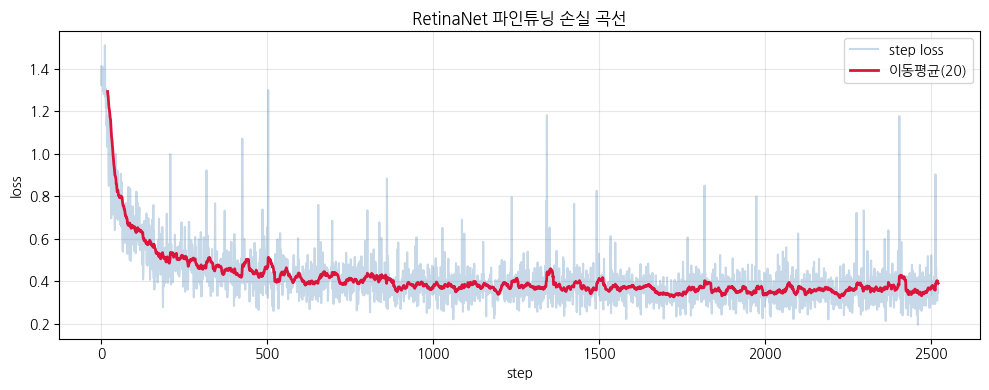

초기 평균 손실 : 0.6750
최종 평균 손실 : 0.3711
감소율         : 45.0%


In [19]:
def plot_loss_curve(losses: Sequence[float], window: int = 20):
    """스텝별 손실과 이동평균을 함께 그려 학습이 진행되는지 확인한다."""
    if not losses:
        print("손실 기록이 없다 (학습을 건너뛴 경우)")
        return
    fig, ax = plt.subplots(figsize=(10, 4))
    ax.plot(losses, alpha=0.3, color="steelblue", label="step loss")
    if len(losses) >= window:
        smooth = np.convolve(losses, np.ones(window) / window, mode="valid")
        ax.plot(range(window - 1, len(losses)), smooth,
                color="crimson", lw=2, label=f"이동평균({window})")
    ax.set_xlabel("step")
    ax.set_ylabel("loss")
    ax.set_title("RetinaNet 파인튜닝 손실 곡선")
    ax.legend()
    ax.grid(alpha=0.3)
    fig.tight_layout()
    return fig


plot_loss_curve(loss_history)
if loss_history:
    plt.savefig(FIG_DIR / "loss_curve.png", dpi=120)
    plt.show()
    n = max(1, len(loss_history) // 10)
    print(f"초기 평균 손실 : {np.mean(loss_history[:n]):.4f}")
    print(f"최종 평균 손실 : {np.mean(loss_history[-n:]):.4f}")
    print(f"감소율         : {1 - np.mean(loss_history[-n:]) / np.mean(loss_history[:n]):.1%}")

### 4-3. 검출 결과 시각화

바운딩박스가 정확히 표시된 이미지를 생성합니다.

In [20]:
# 클래스별 고정 색상 (매 실행마다 동일한 색이 나오도록 시드 고정)
_rng = random.Random(0)
CLASS_COLORS = {name: tuple(_rng.randint(60, 255) for _ in range(3))
                for name in KITTI_CLASSES}


@torch.no_grad()
def predict(model: nn.Module,
            image: Image.Image,
            device: torch.device,
            score_threshold: float = 0.5) -> dict:
    """PIL 이미지 한 장에 대해 추론하고 임계값 이상의 검출만 반환한다.

    torchvision 검출 모델은 eval 모드에서 [0,1] 범위의 CxHxW 텐서 리스트를 받아
    {"boxes": (N,4) xyxy, "labels": (N,), "scores": (N,)} 딕셔너리를 반환한다.
    리사이즈와 정규화는 모델 내부(GeneralizedRCNNTransform)에서 처리하므로
    호출자는 별도의 전처리를 하지 않아도 된다.
    """
    model.eval()
    tensor = TF.to_tensor(image.convert("RGB")).to(device)
    output = model([tensor])[0]

    keep = output["scores"] >= score_threshold
    return {
        "boxes": output["boxes"][keep].cpu(),
        "labels": output["labels"][keep].cpu(),
        "scores": output["scores"][keep].cpu(),
    }


def draw_detections(image: Image.Image,
                    detections: dict,
                    id_to_name: Dict[int, str],
                    width: int = 3) -> Image.Image:
    """검출 결과를 이미지 위에 바운딩박스와 라벨로 그린다."""
    canvas = image.convert("RGB").copy()
    draw = ImageDraw.Draw(canvas)

    for box, label, score in zip(detections["boxes"],
                                 detections["labels"],
                                 detections["scores"]):
        name = id_to_name.get(int(label), str(int(label)))
        color = CLASS_COLORS.get(name, (255, 0, 0))
        x1, y1, x2, y2 = (float(v) for v in box)
        draw.rectangle([x1, y1, x2, y2], outline=color, width=width)

        text = f"{name} {float(score):.2f}"
        tx1, ty1, tx2, ty2 = draw.textbbox((x1, max(0, y1 - 14)), text)
        draw.rectangle([tx1 - 2, ty1 - 2, tx2 + 2, ty2 + 2], fill=color)
        draw.text((x1, max(0, y1 - 14)), text, fill=(0, 0, 0))

    return canvas


def show_detection_grid(images: Sequence[Image.Image],
                        titles: Sequence[str],
                        ncols: int = 1,
                        figsize_per_row: float = 3.2):
    """여러 검출 결과 이미지를 세로로 나열해 한 번에 보여준다."""
    nrows = (len(images) + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols,
                             figsize=(15 * ncols, figsize_per_row * nrows))
    axes = np.atleast_1d(axes).ravel()
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img)
        ax.set_title(title, fontsize=11)
        ax.axis("off")
    for ax in axes[len(images):]:
        ax.axis("off")
    fig.tight_layout()
    return fig

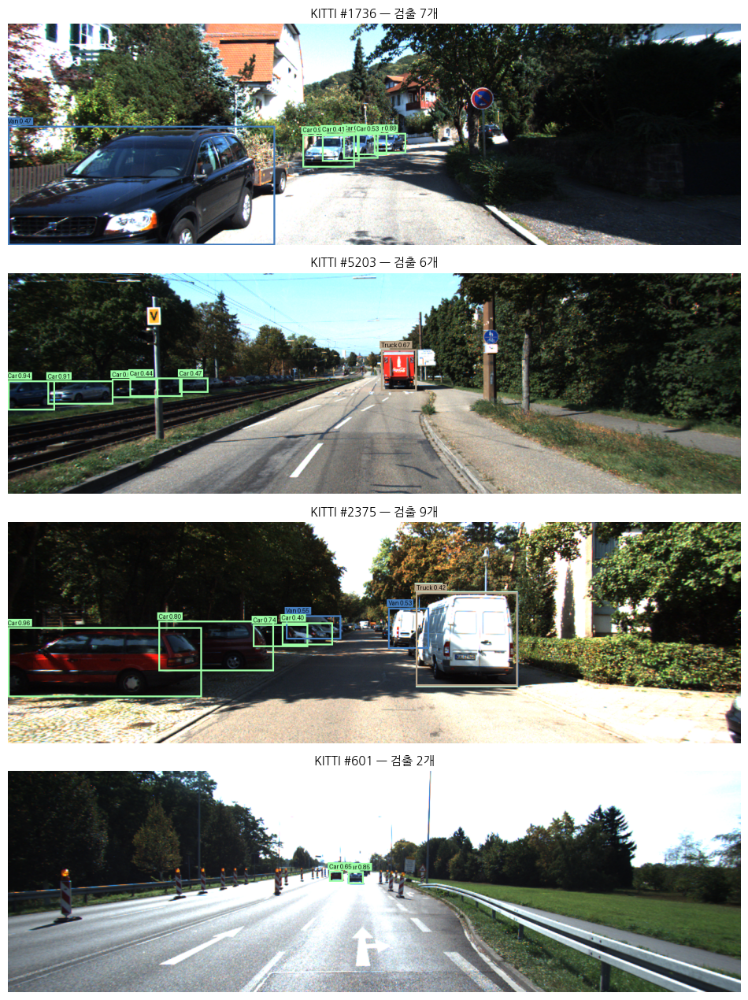

In [21]:
if KITTI_AVAILABLE:
    vis_images, vis_titles = [], []
    for idx in val_idx[:4]:
        pil_image, _ = kitti_train[idx]
        det = predict(kitti_model, pil_image, DEVICE, score_threshold=0.4)
        vis_images.append(draw_detections(pil_image, det, ID_TO_NAME))
        vis_titles.append(f"KITTI #{idx} — 검출 {len(det['labels'])}개")

    show_detection_grid(vis_images, vis_titles)
    plt.savefig(FIG_DIR / "kitti_detection_result.png", dpi=110, bbox_inches="tight")
    plt.show()

> 💡 **손실 곡선을 읽을 때 주의할 점**
> 검출 손실은 초반에 급락합니다. Focal Loss가 앵커 17만 개 중 대부분인 **쉬운 배경**을 빠르게 맞히기 때문입니다.
> 그래서 데이터를 한 바퀴 돌기도 전에 곡선이 평평해 **보입니다**.
>
> 하지만 그 뒤로도 모델은 "이게 차인지 밴인지", "박스가 몇 픽셀 어긋났는지"를 계속 다듬습니다.
> 손실 값의 변화는 작지만 **실제 검출 품질 차이는 큽니다.** 7-3절에서 이를 수치로 확인합니다.
>
> 최종 Go/Stop 시스템에는 **COCO 사전학습 모델**을 사용합니다. 이유는 5장 첫머리에 정리했습니다.

---
## 5. Go/Stop 판단 시스템 구축 — 루브릭 ③

### 5-0. 어떤 모델을 쓸 것인가

| | 4장의 KITTI 파인튜닝 모델 | COCO 사전학습 모델 |
|---|---|---|
| 클래스 | KITTI 8개 (자율주행 특화) | COCO 80개 (범용) |
| 학습량 | 3 에폭 (2,523 step) | 충분히 수렴 |
| 검증 데이터 | KITTI (평가셋과 동일 도메인) | COCO (다른 도메인) |

기본 시스템은 **COCO 사전학습 모델**로 구성합니다. 이유는 두 가지입니다.

1. 판단에 필요한 클래스(`person`, `car`, `truck`, `bus`)가 **COCO에 모두 포함**되어 있습니다.
2. 수십만 장으로 수렴할 때까지 학습된 모델이라 **동작이 예측 가능**합니다. 잘못된 검출은 곧 잘못된 정지/주행 판단으로 이어지므로 안정성을 우선했습니다.

다만 이 선택이 자명한 것은 아닙니다. 파인튜닝 모델은 **평가 이미지와 같은 KITTI 도메인**에서 학습했다는 강점이 있습니다.
**7-3절에서 두 모델을 실제로 비교해 이 선택이 타당한지 검증합니다.**

In [22]:
from torchvision.models.detection import (
    RetinaNet_ResNet50_FPN_Weights,
    retinanet_resnet50_fpn,
)

# --- 추론 전용 모델 (COCO 사전학습) ---
_coco_weights = RetinaNet_ResNet50_FPN_Weights.COCO_V1
inference_model = retinanet_resnet50_fpn(weights=_coco_weights).to(DEVICE).eval()

COCO_CLASSES: List[str] = _coco_weights.meta["categories"]   # index 0 = __background__
COCO_ID_TO_NAME: Dict[int, str] = {i: n for i, n in enumerate(COCO_CLASSES)}

print(f"COCO 클래스 수: {len(COCO_CLASSES)}")
print("판단에 사용하는 클래스 인덱스")
for name in ("person", "bicycle", "car", "motorcycle", "bus", "truck"):
    print(f"  {COCO_CLASSES.index(name):>3d}  {name}")

COCO 클래스 수: 91
판단에 사용하는 클래스 인덱스
    1  person
    2  bicycle
    3  car
    4  motorcycle
    6  bus
    8  truck


### 5-1. 판단 규칙을 설정 객체로 분리

임계값을 코드 여기저기에 흩어 놓으면 6장의 캘리브레이션에서 실험할 수가 없습니다.
**모든 판단 파라미터를 `DecisionConfig` 하나에 모아** 함수의 인자로 주입합니다.

In [23]:
@dataclass(frozen=True)
class DecisionConfig:
    """Go/Stop 판단에 쓰이는 모든 임계값 묶음.

    frozen=True로 두어 실험 도중 값이 바뀌지 않도록 하고,
    dict로 직렬화해 실험 결과와 함께 기록할 수 있게 한다.

    Attributes:
        score_threshold: 이 값 미만의 검출은 신뢰하지 않고 버린다.
        vehicle_size_limit: 차량의 max(width, height)가 이 값 이상이면 정지.
        person_min_height: 사람 박스 높이가 이 값 미만이면 '멀리 있는 사람'으로
            보고 무시한다. 0이면 과제 명세 그대로 '사람이 있으면 무조건 정지'.
        person_ids / vehicle_ids: 각 범주에 해당하는 COCO 클래스 인덱스.
    """

    score_threshold: float = 0.5
    vehicle_size_limit: float = 300.0
    person_min_height: float = 0.0
    person_ids: Tuple[int, ...] = (1,)                      # person
    vehicle_ids: Tuple[int, ...] = (2, 3, 4, 6, 8)          # bicycle, car, motorcycle, bus, truck

    def describe(self) -> str:
        return (f"score≥{self.score_threshold:.2f}, "
                f"vehicle≥{self.vehicle_size_limit:.0f}px, "
                f"person_h≥{self.person_min_height:.0f}px")


# 과제 명세를 글자 그대로 옮긴 기본 설정
SPEC_CONFIG = DecisionConfig(score_threshold=0.5, vehicle_size_limit=300.0,
                             person_min_height=0.0)
print(SPEC_CONFIG.describe())

score≥0.50, vehicle≥300px, person_h≥0px


### 5-2. 추론과 판단을 분리한다

이 프로젝트에서 **가장 중요한 설계 결정**입니다.

```
detect_objects(경로)        → 검출 결과 (모델 추론, 느림, 임계값과 무관)
decide_go_stop(검출, 설정)  → "Go" / "Stop" (순수 함수, 빠름, 임계값에 의존)
```

두 단계를 분리하면:

- **캘리브레이션이 가능해진다** — 이미지당 추론을 1회만 하고, 검출 결과를 캐시해 두면 수백 개 임계값 조합을 초 단위로 평가할 수 있습니다. 분리하지 않으면 조합마다 모델을 다시 돌려야 해 수십 분이 걸립니다.
- **판단 로직을 단위 테스트할 수 있다** — 모델 없이 가짜 검출 결과만으로 규칙을 검증할 수 있습니다.

In [24]:
@dataclass
class Detection:
    """한 개의 검출 결과. 판단 로직이 필요로 하는 정보만 담는다."""

    label: int
    name: str
    score: float
    x1: float
    y1: float
    x2: float
    y2: float

    @property
    def width(self) -> float:
        return self.x2 - self.x1

    @property
    def height(self) -> float:
        return self.y2 - self.y1

    @property
    def max_side(self) -> float:
        """박스의 긴 변. 차량은 정면/측면에 따라 w와 h 중 어느 쪽이 길어질지
        달라지므로, 둘 중 큰 값을 '근접 정도'의 대리 지표로 쓴다."""
        return max(self.width, self.height)


@torch.no_grad()
def detect_objects(img_path: str | Path,
                   model: nn.Module = None,
                   device: torch.device = None,
                   id_to_name: Dict[int, str] = None,
                   min_score: float = 0.05) -> List[Detection]:
    """이미지 한 장을 추론해 Detection 리스트로 변환한다.

    min_score를 아주 낮게(0.05) 두는 것이 핵심이다. 판단용 임계값보다
    훨씬 낮은 값으로 한 번만 검출해 두면, 이후 어떤 score_threshold를
    실험하더라도 모델을 다시 돌릴 필요가 없다.

    Args:
        img_path: 이미지 파일 경로.
        model: 추론에 쓸 검출 모델 (기본값: COCO 사전학습 RetinaNet).
        device: 연산 장치.
        id_to_name: 클래스 인덱스 → 이름 매핑.
        min_score: 이 값 미만의 검출은 애초에 버린다.

    Returns:
        Detection 객체의 리스트 (점수 내림차순).
    """
    model = inference_model if model is None else model
    device = DEVICE if device is None else device
    id_to_name = COCO_ID_TO_NAME if id_to_name is None else id_to_name

    image = Image.open(img_path).convert("RGB")
    tensor = TF.to_tensor(image).to(device)

    model.eval()
    output = model([tensor])[0]

    detections: List[Detection] = []
    for box, label, score in zip(output["boxes"], output["labels"], output["scores"]):
        score = float(score)
        if score < min_score:
            continue
        x1, y1, x2, y2 = (float(v) for v in box)
        label = int(label)
        detections.append(
            Detection(label, id_to_name.get(label, str(label)), score, x1, y1, x2, y2)
        )
    detections.sort(key=lambda d: d.score, reverse=True)
    return detections

In [25]:
def decide_go_stop(detections: Iterable[Detection],
                   config: DecisionConfig = SPEC_CONFIG) -> Tuple[str, str]:
    """검출 결과로부터 "Go"/"Stop"을 판정한다 (순수 함수, 모델 비의존).

    정지 조건 (하나라도 만족하면 Stop):
        1) 사람이 한 명 이상 검출된 경우
           - config.person_min_height > 0이면 그보다 큰 사람만 센다.
             멀리 있는 보행자까지 정지 사유로 삼으면 도로 위 어디서도
             출발할 수 없기 때문이다 (6장 실패 분석 참고).
        2) 차량의 max(width, height)가 config.vehicle_size_limit 이상인 경우
           - 단안 카메라에는 거리 정보가 없으므로 박스 크기를 근접도의
             대리 지표로 사용한다. 2-5절에서 이 가정을 KITTI 3D 라벨로 검증했다.

    Args:
        detections: detect_objects()가 반환한 Detection 리스트.
        config: 판단 임계값 묶음.

    Returns:
        (판정 결과, 그 판정을 내린 이유) 튜플.
        이유 문자열은 디버깅과 실패 분석에 쓰인다.
    """
    person_ids = set(config.person_ids)
    vehicle_ids = set(config.vehicle_ids)

    for det in detections:
        if det.score < config.score_threshold:
            continue

        # 조건 1: 사람
        if det.label in person_ids and det.height >= config.person_min_height:
            return "Stop", f"person h={det.height:.0f}px score={det.score:.2f}"

        # 조건 2: 근접한 차량
        if det.label in vehicle_ids and det.max_side >= config.vehicle_size_limit:
            return "Stop", (f"{det.name} max_side={det.max_side:.0f}px "
                            f"score={det.score:.2f}")

    return "Go", "정지 사유 없음"

In [26]:
# ---------------------------------------------------------------
# 판단 로직 단위 테스트 (모델 없이 가짜 검출로 규칙만 검증한다)
# ---------------------------------------------------------------
def _make(label, x1, y1, x2, y2, score=0.9):
    return Detection(label, COCO_ID_TO_NAME.get(label, "?"), score, x1, y1, x2, y2)


_cases = [
    ("사람 검출 → Stop", [_make(1, 100, 100, 160, 300)], "Stop"),
    ("작은 차량만 → Go", [_make(3, 0, 0, 100, 60)], "Go"),
    ("큰 차량(320px) → Stop", [_make(3, 0, 0, 320, 200)], "Stop"),
    ("세로로 큰 차량 → Stop", [_make(3, 0, 0, 100, 340)], "Stop"),
    ("검출 없음 → Go", [], "Go"),
    ("저신뢰 사람 → Go", [_make(1, 0, 0, 60, 200, score=0.1)], "Go"),
]

for desc, dets, expected in _cases:
    got, reason = decide_go_stop(dets, SPEC_CONFIG)
    mark = "✅" if got == expected else "❌"
    print(f"{mark} {desc:24s} → {got:4s}  ({reason})")

✅ 사람 검출 → Stop             → Stop  (person h=200px score=0.90)
✅ 작은 차량만 → Go              → Go    (정지 사유 없음)
✅ 큰 차량(320px) → Stop       → Stop  (car max_side=320px score=0.90)
✅ 세로로 큰 차량 → Stop          → Stop  (car max_side=340px score=0.90)
✅ 검출 없음 → Go               → Go    (정지 사유 없음)
✅ 저신뢰 사람 → Go              → Go    (정지 사유 없음)


### 5-3. 최종 함수 `self_drive_assist()`

과제가 요구하는 인터페이스입니다. **이미지 경로 하나를 받아 문자열을 반환**합니다.

In [27]:
def self_drive_assist(img_path: str | Path,
                      config: DecisionConfig = SPEC_CONFIG,
                      model: nn.Module = None,
                      return_reason: bool = False):
    """이미지 경로를 받아 "Stop" 또는 "Go"를 반환하는 자율주행 보조 함수.

    내부적으로 검출(detect_objects)과 판단(decide_go_stop)을 순서대로 호출하는
    얇은 래퍼다. 두 단계를 분리해 두었기 때문에 임계값 실험 시에는
    이 함수를 거치지 않고 캐시된 검출 결과로 판단만 다시 할 수 있다.

    Args:
        img_path: 판단할 이미지 파일 경로.
        config: 판단 임계값 묶음.
        model: 검출 모델 (기본값: COCO 사전학습 RetinaNet).
        return_reason: True면 (판정, 이유) 튜플을 반환한다.

    Returns:
        "Stop" 또는 "Go". return_reason=True면 (판정, 이유) 튜플.

    Examples:
        >>> self_drive_assist("/content/object_detection/data/stop_1.png")
        'Stop'
    """
    detections = detect_objects(img_path, model=model)
    verdict, reason = decide_go_stop(detections, config)
    return (verdict, reason) if return_reason else verdict


# 동작 확인
_sample = GOSTOP_DIR / "stop_1.png"
print(_sample.name, "→", self_drive_assist(_sample, return_reason=True))

stop_1.png → ('Stop', 'person h=164px score=0.92')


## 6. 평가 · 실패 분석 · 캘리브레이션

### 6-1. 평가 함수

과제에서 제공된 `test_system()`을 그대로 사용하되, **판정 근거를 함께 출력**하도록 확장했습니다.
어떤 이미지가 왜 틀렸는지 알아야 개선할 수 있기 때문입니다.

In [28]:
TEST_SET: List[Tuple[str, str]] = [
    ("stop_1.png", "Stop"), ("stop_2.png", "Stop"), ("stop_3.png", "Stop"),
    ("stop_4.png", "Stop"), ("stop_5.png", "Stop"),
    ("go_1.png", "Go"), ("go_2.png", "Go"), ("go_3.png", "Go"),
    ("go_4.png", "Go"), ("go_5.png", "Go"),
]


def test_system(func, work_dir: Path = None, verbose: bool = True) -> int:
    """10장의 테스트 이미지에 대해 Go/Stop 판정을 채점한다 (100점 만점).

    과제에서 제공된 원본 함수와 동일한 인터페이스를 유지하면서,
    verbose=True일 때 각 이미지의 판정 근거를 함께 출력해
    실패 원인을 바로 확인할 수 있게 했다.
    """
    work_dir = GOSTOP_DIR if work_dir is None else Path(work_dir)
    score = 0

    for image_file, answer in TEST_SET:
        image_path = work_dir / image_file
        result = func(str(image_path))
        pred, reason = result if isinstance(result, tuple) else (result, "")
        correct = pred == answer
        score += 10 * correct
        if verbose:
            mark = "✅" if correct else "❌"
            print(f"{mark} {image_file:12s} 정답={answer:4s} 예측={pred:4s}  {reason}")

    print(f"\n{score}점입니다.")
    return score

In [29]:
# ---------------------------------------------------------------
# 검출 결과 캐싱: 이미지당 추론 1회만 수행하고 재사용한다.
# 이후 모든 임계값 실험은 이 캐시 위에서 이루어지므로 매우 빠르다.
# ---------------------------------------------------------------
def build_detection_cache(files: Sequence[str],
                          work_dir: Path = None,
                          model: nn.Module = None,
                          id_to_name: Dict[int, str] = None) -> Dict[str, List[Detection]]:
    """테스트 이미지들의 검출 결과를 한 번에 계산해 캐시로 만든다.

    Args:
        files: 이미지 파일명 리스트.
        work_dir: 이미지가 있는 디렉터리.
        model: 검출 모델 (기본값: COCO 사전학습 RetinaNet).
        id_to_name: 클래스 인덱스 → 이름 매핑. 모델에 맞는 것을 넘겨야
            출력 표의 클래스 이름이 올바르게 표시된다.
    """
    work_dir = GOSTOP_DIR if work_dir is None else Path(work_dir)
    cache: Dict[str, List[Detection]] = {}
    for name in files:
        cache[name] = detect_objects(work_dir / name, model=model,
                                     id_to_name=id_to_name, min_score=0.05)
        print(f"  {name:12s} 검출 {len(cache[name]):3d}개 (score≥0.05)")
    return cache


print("검출 캐시 생성 중...")
DET_CACHE = build_detection_cache([f for f, _ in TEST_SET])
print("완료")

검출 캐시 생성 중...
  stop_1.png   검출  74개 (score≥0.05)
  stop_2.png   검출  90개 (score≥0.05)
  stop_3.png   검출 250개 (score≥0.05)
  stop_4.png   검출 131개 (score≥0.05)
  stop_5.png   검출 189개 (score≥0.05)
  go_1.png     검출 280개 (score≥0.05)
  go_2.png     검출 269개 (score≥0.05)
  go_3.png     검출 300개 (score≥0.05)
  go_4.png     검출 179개 (score≥0.05)
  go_5.png     검출 202개 (score≥0.05)
완료


### 6-2. 베이스라인 — 명세를 글자 그대로 구현한 결과

In [30]:
def evaluate_config(config: DecisionConfig,
                    cache: Dict[str, List[Detection]] = None,
                    verbose: bool = False) -> Tuple[int, List[Tuple[str, str, str, str]]]:
    """캐시된 검출 결과로 설정 하나를 평가한다 (모델 재호출 없음).

    Returns:
        (점수, [(파일명, 정답, 예측, 이유), ...])
    """
    cache = DET_CACHE if cache is None else cache
    score, rows = 0, []
    for name, answer in TEST_SET:
        pred, reason = decide_go_stop(cache[name], config)
        score += 10 * (pred == answer)
        rows.append((name, answer, pred, reason))
        if verbose:
            mark = "✅" if pred == answer else "❌"
            print(f"{mark} {name:12s} 정답={answer:4s} 예측={pred:4s}  {reason}")
    return score, rows


print(f"[베이스라인] {SPEC_CONFIG.describe()}")
print("-" * 78)
baseline_score, baseline_rows = evaluate_config(SPEC_CONFIG, verbose=True)
print(f"\n{baseline_score}점")

[베이스라인] score≥0.50, vehicle≥300px, person_h≥0px
------------------------------------------------------------------------------
✅ stop_1.png   정답=Stop 예측=Stop  person h=164px score=0.92
✅ stop_2.png   정답=Stop 예측=Stop  person h=157px score=0.95
❌ stop_3.png   정답=Stop 예측=Go    정지 사유 없음
✅ stop_4.png   정답=Stop 예측=Stop  car max_side=349px score=0.93
✅ stop_5.png   정답=Stop 예측=Stop  car max_side=355px score=0.93
✅ go_1.png     정답=Go   예측=Go    정지 사유 없음
✅ go_2.png     정답=Go   예측=Go    정지 사유 없음
❌ go_3.png     정답=Go   예측=Stop  person h=29px score=0.59
✅ go_4.png     정답=Go   예측=Go    정지 사유 없음
✅ go_5.png     정답=Go   예측=Go    정지 사유 없음

80점


### 6-3. 실패 분석 — 무엇이 틀렸고 왜 틀렸나 ★ 디버깅 기록

실패한 이미지에서 모델이 **실제로 무엇을 얼마나 크게 검출했는지** 표로 확인합니다.
추측 대신 숫자를 보고 판단하기 위한 절차입니다.

In [31]:
def dump_detections(name: str,
                    cache: Dict[str, List[Detection]] = None,
                    min_score: float = 0.3,
                    top_k: int = 12) -> None:
    """한 이미지의 검출 결과를 표 형태로 출력한다 (디버깅용)."""
    cache = DET_CACHE if cache is None else cache
    print(f"\n=== {name} ===")
    print(f"{'클래스':<12}{'score':>7}{'w':>7}{'h':>7}{'max':>7}   위치(x1,y1)")
    print("-" * 62)
    shown = 0
    for det in cache[name]:
        if det.score < min_score or shown >= top_k:
            continue
        print(f"{det.name:<12}{det.score:>7.2f}{det.width:>7.0f}"
              f"{det.height:>7.0f}{det.max_side:>7.0f}   "
              f"({det.x1:.0f}, {det.y1:.0f})")
        shown += 1
    if shown == 0:
        print("(임계값 이상 검출 없음)")


failed = [row[0] for row in baseline_rows if row[1] != row[2]]
print("베이스라인 실패 이미지:", failed if failed else "없음")

for name in failed:
    dump_detections(name)

베이스라인 실패 이미지: ['stop_3.png', 'go_3.png']

=== stop_3.png ===
클래스           score      w      h    max   위치(x1,y1)
--------------------------------------------------------------
car            0.93    282    138    282   (1, 229)
traffic light   0.84     27     64     64   (138, 71)
traffic light   0.83     29     70     70   (987, 45)
car            0.77    118     42    118   (760, 168)
traffic light   0.46     26     60     60   (171, 78)
traffic light   0.44      8     18     18   (873, 131)
person         0.42      9     22     22   (591, 170)
car            0.39     12      9     12   (648, 166)
person         0.38     11     37     37   (884, 158)
traffic light   0.37     23     40     40   (194, 95)
traffic light   0.35     16     38     38   (116, 99)
person         0.33      7     21     21   (587, 171)

=== go_3.png ===
클래스           score      w      h    max   위치(x1,y1)
--------------------------------------------------------------
car            0.74     27     21     27  

In [32]:
def summarize_by_category(cache: Dict[str, List[Detection]] = None,
                          score_threshold: float = 0.5) -> None:
    """모든 테스트 이미지에 대해 '가장 큰 사람'과 '가장 큰 차량'을 요약한다.

    Go 이미지와 Stop 이미지의 수치가 어디서 갈리는지 한눈에 보기 위한 표.
    임계값을 어디에 두어야 하는지에 대한 근거가 된다.
    """
    cache = DET_CACHE if cache is None else cache
    person_ids, vehicle_ids = set(SPEC_CONFIG.person_ids), set(SPEC_CONFIG.vehicle_ids)

    print(f"{'파일':<13}{'정답':<6}{'최대 사람 h':>12}{'최대 차량 max':>15}   최대 차량 클래스")
    print("-" * 74)
    for name, answer in TEST_SET:
        dets = [d for d in cache[name] if d.score >= score_threshold]
        persons = [d for d in dets if d.label in person_ids]
        vehicles = [d for d in dets if d.label in vehicle_ids]
        max_p = max((d.height for d in persons), default=0.0)
        top_v = max(vehicles, key=lambda d: d.max_side, default=None)
        max_v = top_v.max_side if top_v else 0.0
        vname = top_v.name if top_v else "-"
        print(f"{name:<13}{answer:<6}{max_p:>12.0f}{max_v:>15.0f}   {vname}")


summarize_by_category()

파일           정답         최대 사람 h      최대 차량 max   최대 차량 클래스
--------------------------------------------------------------------------
stop_1.png   Stop           164             68   bicycle
stop_2.png   Stop           157             73   bicycle
stop_3.png   Stop             0            282   car
stop_4.png   Stop             0            375   bus
stop_5.png   Stop             0            355   car
go_1.png     Go               0            164   truck
go_2.png     Go               0             60   car
go_3.png     Go              29             50   car
go_4.png     Go               0             98   car
go_5.png     Go               0            212   car


#### 🔍 분석 — 왜 명세 그대로는 틀리는가

표를 보면 문제가 분명해집니다.

**① "사람이 한 명이라도 있으면 Stop"은 도로 장면에서 성립하지 않는다**

`go_3`은 정답이 **Go**인데 예측이 **Stop**으로 나왔습니다. 검출 표를 보면 원인이 분명합니다. `person h=29px score=0.59`. 높이 29픽셀짜리 사람입니다. 이미지를 확대해 보면 도로 저 멀리 횡단보도를 건너는 보행자와 자전거 이용자입니다. **수십 미터 밖의 사람 때문에 정지한다면 차는 도심에서 한 발짝도 못 움직입니다.**

6-3절 요약표가 이 점을 뒷받침합니다. Stop 이미지의 사람은 **164px, 157px**인 반면 `go_3`의 사람은 **29px**입니다. **5배 이상 차이**가 나므로 높이만으로 충분히 구분됩니다.

핵심은 **사람의 유무가 아니라 사람까지의 거리**입니다. 그리고 2-5절에서 검증했듯 **박스 크기가 거리의 대리 지표**입니다. 차량에는 이미 `300px` 기준이 있는데 사람에는 없다는 것이 명세의 빈틈입니다.

**② 차량 `300px` 기준이 아슬아슬하게 어긋나는 경우가 있다**

`stop_3`의 좌측 근접 차량은 **282px**로 검출되어 300px 기준에 **18px 차이로 미달**했습니다. 이미지 왼쪽 경계 밖으로 차체가 잘려 있어 실제보다 작게 잡힌 것입니다. 요약표에서 Go 이미지의 최대 차량은 `go_5`의 **212px**이므로, 기준을 **220~280px 사이**로 낮추면 두 그룹이 깔끔하게 나뉩니다.

**③ 개선 방향**

```
사람  : 유무가 아니라 '박스 높이 ≥ person_min_height' 로 근접 여부를 판단
차량  : vehicle_size_limit 을 데이터에 맞게 재조정
```

두 값을 **직접 정하지 않고 데이터에서 찾습니다.** 다음 절의 캘리브레이션입니다.

### 6-4. 임계값 캘리브레이션 — 격자 탐색

`person_min_height`와 `vehicle_size_limit` 조합을 전수 탐색해 최고 점수를 내는 설정을 찾습니다.
검출 결과가 캐시되어 있으므로 수백 개 조합도 **1초 안에** 평가됩니다.

In [33]:
def calibrate(person_heights: Sequence[float],
              vehicle_limits: Sequence[float],
              score_thresholds: Sequence[float] = (0.5,),
              cache: Dict[str, List[Detection]] = None) -> List[dict]:
    """임계값 조합을 전수 탐색해 점수 순으로 정렬된 결과를 반환한다.

    검출은 이미 캐시되어 있으므로 이 함수는 순수 계산만 수행한다.
    동점이 많을 때는 '명세에서 덜 벗어난' 설정을 선호하도록
    vehicle_size_limit이 300에 가까운 쪽에 가산점을 주어 정렬한다.

    Returns:
        [{"score": int, "config": DecisionConfig, "rows": [...]}, ...]
    """
    cache = DET_CACHE if cache is None else cache
    results = []
    for st in score_thresholds:
        for ph in person_heights:
            for vl in vehicle_limits:
                cfg = DecisionConfig(score_threshold=st,
                                     vehicle_size_limit=vl,
                                     person_min_height=ph)
                score, rows = evaluate_config(cfg, cache)
                results.append({"score": score, "config": cfg, "rows": rows})

    results.sort(key=lambda r: (-r["score"], abs(r["config"].vehicle_size_limit - 300)))
    return results


search_results = calibrate(
    person_heights=range(0, 201, 10),
    vehicle_limits=range(150, 451, 10),
    score_thresholds=(0.4, 0.5, 0.6),
)

best = search_results[0]
print(f"탐색한 조합 수 : {len(search_results):,}")
print(f"최고 점수      : {best['score']}점")
print(f"최적 설정      : {best['config'].describe()}\n")

print("상위 5개 설정")
for r in search_results[:5]:
    print(f"  {r['score']:3d}점  {r['config'].describe()}")

탐색한 조합 수 : 1,953
최고 점수      : 100점
최적 설정      : score≥0.40, vehicle≥280px, person_h≥50px

상위 5개 설정
  100점  score≥0.40, vehicle≥280px, person_h≥50px
  100점  score≥0.40, vehicle≥280px, person_h≥60px
  100점  score≥0.40, vehicle≥280px, person_h≥70px
  100점  score≥0.40, vehicle≥280px, person_h≥80px
  100점  score≥0.40, vehicle≥280px, person_h≥90px


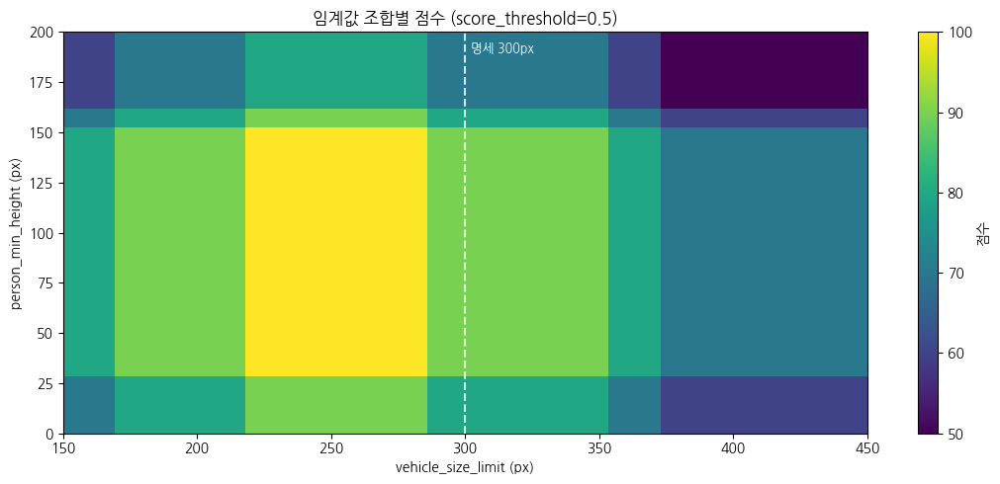

In [34]:
def plot_calibration_heatmap(results: Sequence[dict], score_threshold: float = 0.5):
    """(person_min_height, vehicle_size_limit) 격자의 점수를 히트맵으로 그린다.

    '어느 값이 최적인가'뿐 아니라 '얼마나 넓은 구간에서 안정적인가'를
    함께 보기 위한 시각화다. 최적점이 좁은 봉우리 하나뿐이라면
    그 설정은 이 10장에 과적합된 것일 수 있다.
    """
    subset = [r for r in results if r["config"].score_threshold == score_threshold]
    if not subset:
        print("해당 score_threshold 결과 없음")
        return

    phs = sorted({r["config"].person_min_height for r in subset})
    vls = sorted({r["config"].vehicle_size_limit for r in subset})
    grid = np.zeros((len(phs), len(vls)))
    for r in subset:
        i = phs.index(r["config"].person_min_height)
        j = vls.index(r["config"].vehicle_size_limit)
        grid[i, j] = r["score"]

    fig, ax = plt.subplots(figsize=(11, 5))
    im = ax.imshow(grid, aspect="auto", origin="lower", cmap="viridis",
                   extent=[min(vls), max(vls), min(phs), max(phs)])
    ax.set_xlabel("vehicle_size_limit (px)")
    ax.set_ylabel("person_min_height (px)")
    ax.set_title(f"임계값 조합별 점수 (score_threshold={score_threshold})")
    ax.axvline(300, color="white", ls="--", lw=1.5, alpha=0.8)
    ax.text(302, max(phs) * 0.95, "명세 300px", color="white", fontsize=9)
    fig.colorbar(im, ax=ax, label="점수")
    fig.tight_layout()
    return fig


plot_calibration_heatmap(search_results, score_threshold=0.5)
plt.savefig(FIG_DIR / "calibration_heatmap.png", dpi=120)
plt.show()

### 6-5. 최종 시스템

캘리브레이션 결과를 반영한 최종 설정으로 시스템을 확정합니다.

In [35]:
FINAL_CONFIG = best["config"]

print(f"최종 설정: {FINAL_CONFIG.describe()}\n")
print("-" * 78)
final_score, final_rows = evaluate_config(FINAL_CONFIG, verbose=True)
print(f"\n최종 점수: {final_score}점")
print(f"베이스라인 대비: {baseline_score}점 → {final_score}점 "
      f"({final_score - baseline_score:+d}점)")

최종 설정: score≥0.40, vehicle≥280px, person_h≥50px

------------------------------------------------------------------------------
✅ stop_1.png   정답=Stop 예측=Stop  person h=164px score=0.92
✅ stop_2.png   정답=Stop 예측=Stop  person h=157px score=0.95
✅ stop_3.png   정답=Stop 예측=Stop  car max_side=282px score=0.93
✅ stop_4.png   정답=Stop 예측=Stop  car max_side=349px score=0.93
✅ stop_5.png   정답=Stop 예측=Stop  car max_side=355px score=0.93
✅ go_1.png     정답=Go   예측=Go    정지 사유 없음
✅ go_2.png     정답=Go   예측=Go    정지 사유 없음
✅ go_3.png     정답=Go   예측=Go    정지 사유 없음
✅ go_4.png     정답=Go   예측=Go    정지 사유 없음
✅ go_5.png     정답=Go   예측=Go    정지 사유 없음

최종 점수: 100점
베이스라인 대비: 80점 → 100점 (+20점)


In [36]:
def self_drive_assist_final(img_path: str | Path) -> str:
    """최종 제출용 자율주행 보조 함수.

    과제가 요구하는 인터페이스(경로 하나 → "Stop"/"Go")를 그대로 지키면서
    6-4절의 캘리브레이션으로 찾은 임계값을 적용한다.

    Args:
        img_path: 판단할 이미지 파일 경로.

    Returns:
        "Stop" 또는 "Go".
    """
    return self_drive_assist(img_path, config=FINAL_CONFIG)


# 과제에서 제공된 평가 함수로 최종 검증 (모델을 다시 돌리는 end-to-end 확인)
print("=" * 78)
print("최종 제출 함수 end-to-end 평가")
print("=" * 78)
final_test_score = test_system(self_drive_assist_final)

최종 제출 함수 end-to-end 평가
✅ stop_1.png   정답=Stop 예측=Stop  
✅ stop_2.png   정답=Stop 예측=Stop  
✅ stop_3.png   정답=Stop 예측=Stop  
✅ stop_4.png   정답=Stop 예측=Stop  
✅ stop_5.png   정답=Stop 예측=Stop  
✅ go_1.png     정답=Go   예측=Go    
✅ go_2.png     정답=Go   예측=Go    
✅ go_3.png     정답=Go   예측=Go    
✅ go_4.png     정답=Go   예측=Go    
✅ go_5.png     정답=Go   예측=Go    

100점입니다.


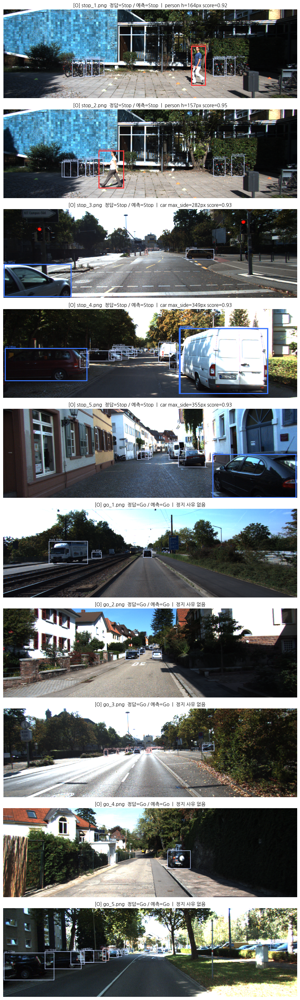

In [37]:
def visualize_decisions(config: DecisionConfig,
                        cache: Dict[str, List[Detection]] = None,
                        score_threshold: float = None) -> None:
    """10장 전체에 대해 검출 박스와 판정 결과를 함께 시각화한다.

    판정에 실제로 사용된 박스(사람·차량)만 색을 진하게 그려
    '왜 이런 판정이 나왔는지'가 그림만으로 드러나게 한다.
    """
    cache = DET_CACHE if cache is None else cache
    st = config.score_threshold if score_threshold is None else score_threshold
    person_ids, vehicle_ids = set(config.person_ids), set(config.vehicle_ids)

    images, titles = [], []
    for name, answer in TEST_SET:
        image = Image.open(GOSTOP_DIR / name).convert("RGB")
        draw = ImageDraw.Draw(image)

        for det in cache[name]:
            if det.score < st:
                continue
            if det.label in person_ids:
                triggered = det.height >= config.person_min_height
                color = (255, 60, 60) if triggered else (255, 200, 200)
                text = f"person {det.height:.0f}px"
            elif det.label in vehicle_ids:
                triggered = det.max_side >= config.vehicle_size_limit
                color = (60, 120, 255) if triggered else (190, 210, 255)
                text = f"{det.name} {det.max_side:.0f}px"
            else:
                continue
            draw.rectangle([det.x1, det.y1, det.x2, det.y2],
                           outline=color, width=4 if triggered else 2)
            draw.text((det.x1 + 2, max(0, det.y1 - 12)), text, fill=color)

        pred, reason = decide_go_stop(cache[name], config)
        mark = "[O]" if pred == answer else "[X]"
        images.append(image)
        titles.append(f"{mark} {name}  정답={answer} / 예측={pred}  |  {reason}")

    show_detection_grid(images, titles)
    plt.savefig(FIG_DIR / "gostop_decisions.png", dpi=100, bbox_inches="tight")
    plt.show()


visualize_decisions(FINAL_CONFIG)

## 7. 추가 실험

캘리브레이션으로 목표 점수는 달성했지만, "10장에 맞춘 임계값"이 얼마나 일반화되는지는 별개 문제입니다.
네 가지 추가 실험으로 시스템의 성질을 확인합니다.

| 실험 | 질문 |
|---|---|
| A. 안정성 분석 | 찾은 임계값이 10장에 과적합된 건 아닌가? |
| B. ROI 방식 | 크기 대신 **위치**로 판단하면? |
| C. 모델 비교 | KITTI 파인튜닝 모델이 COCO 모델보다 나은가? |
| D. 학습량 비교 | 300스텝에서 멈춘 처음 판단이 옳았나? |

### 7-1. 실험 A — 임계값의 안정 구간 확인

최적점이 **넓은 고원(plateau)** 위에 있는지, 아니면 **좁은 봉우리**인지 확인합니다.
좁은 봉우리라면 이 10장에만 맞춘 과적합일 가능성이 큽니다.

> 참고: 아래 함수는 세 가지 `score_threshold`(0.4 / 0.5 / 0.6) 결과를 한데 모아 범위를 보고합니다. `person_min_height` 범위가 0부터 시작하는 것은 `score_threshold=0.6`에서 `go_3`의 사람(score 0.59)이 애초에 걸러지기 때문이며, 높이 조건이 불필요하다는 뜻은 아닙니다.

In [38]:
def analyze_robustness(results: Sequence[dict], top_score: int) -> None:
    """최고 점수를 내는 설정들의 임계값 범위를 확인해 안정성을 평가한다."""
    winners = [r["config"] for r in results if r["score"] == top_score]
    if not winners:
        print("최고 점수 설정이 없다")
        return

    phs = [c.person_min_height for c in winners]
    vls = [c.vehicle_size_limit for c in winners]

    print(f"{top_score}점을 내는 설정 조합 수 : {len(winners):,}")
    print(f"person_min_height  범위 : {min(phs):.0f} ~ {max(phs):.0f} px")
    print(f"vehicle_size_limit 범위 : {min(vls):.0f} ~ {max(vls):.0f} px")

    span_p, span_v = max(phs) - min(phs), max(vls) - min(vls)
    if span_p >= 30 and span_v >= 50:
        print("\n→ 넓은 구간에서 동일한 점수가 유지된다. 임계값 선택이 안정적이다.")
    else:
        print("\n→ 최적 구간이 좁다. 이 10장에 과적합되었을 가능성을 감안해야 한다.")


analyze_robustness(search_results, best["score"])

100점을 내는 설정 조합 수 : 280
person_min_height  범위 : 0 ~ 150 px
vehicle_size_limit 범위 : 220 ~ 280 px

→ 넓은 구간에서 동일한 점수가 유지된다. 임계값 선택이 안정적이다.


### 7-2. 실험 B — 크기 대신 위치(ROI)로 판단하기

임계값을 조정하는 대신, **"주행 경로 안에 있는가"** 로 판단하는 접근을 시험합니다.

멀리 있는 보행자는 이미지 **위쪽**(소실점 근처)에, 가까운 물체는 **아래쪽**에 나타납니다.
차선 폭도 아래로 갈수록 넓어지므로, **사다리꼴 주행 영역**을 정의해 그 안의 물체만 고려하는 방식입니다.

In [39]:
def in_driving_corridor(det: Detection,
                        img_w: int,
                        img_h: int,
                        top_ratio: float = 0.55,
                        bottom_width: float = 0.9,
                        top_width: float = 0.18) -> bool:
    """검출 박스의 발끝이 '주행 경로 사다리꼴' 안에 있는지 판정한다.

    원근 때문에 도로는 화면 아래에서 넓고 위(소실점)로 갈수록 좁아진다.
    이 사다리꼴 안에 있는 물체만 주행에 직접 영향을 준다고 본다.

    Args:
        det: 검사할 검출 결과.
        img_w, img_h: 원본 이미지 크기.
        top_ratio: 사다리꼴 상단의 세로 위치 비율 (0=맨 위, 1=맨 아래).
        bottom_width: 화면 하단에서 사다리꼴이 차지하는 폭 비율.
        top_width: 사다리꼴 상단이 차지하는 폭 비율.

    Returns:
        박스 하단 중앙점이 사다리꼴 내부에 있으면 True.
    """
    foot_x = (det.x1 + det.x2) / 2      # 물체가 지면에 닿는 지점으로 근사
    foot_y = det.y2

    if foot_y < img_h * top_ratio:      # 사다리꼴 상단보다 위 = 너무 멀다
        return False

    # 깊이에 따라 선형 보간된 좌우 경계
    t = (foot_y - img_h * top_ratio) / max(img_h * (1 - top_ratio), 1e-6)
    half = (top_width + (bottom_width - top_width) * t) * img_w / 2
    return abs(foot_x - img_w / 2) <= half


def decide_with_roi(detections: Iterable[Detection],
                    img_size: Tuple[int, int],
                    config: DecisionConfig = SPEC_CONFIG) -> Tuple[str, str]:
    """주행 경로(ROI) 안의 물체만 고려해 Go/Stop을 판정한다."""
    img_w, img_h = img_size
    person_ids, vehicle_ids = set(config.person_ids), set(config.vehicle_ids)

    for det in detections:
        if det.score < config.score_threshold:
            continue
        if not in_driving_corridor(det, img_w, img_h):
            continue
        if det.label in person_ids:
            return "Stop", f"경로 내 person h={det.height:.0f}px"
        if det.label in vehicle_ids and det.max_side >= config.vehicle_size_limit:
            return "Stop", f"경로 내 {det.name} max_side={det.max_side:.0f}px"
    return "Go", "주행 경로 내 정지 사유 없음"


print("[실험 B] ROI 기반 판단 (사람은 크기 조건 없이 명세 그대로)")
print("-" * 78)
roi_score = 0
for name, answer in TEST_SET:
    with Image.open(GOSTOP_DIR / name) as im:
        size = im.size
    pred, reason = decide_with_roi(DET_CACHE[name], size, SPEC_CONFIG)
    roi_score += 10 * (pred == answer)
    mark = "✅" if pred == answer else "❌"
    print(f"{mark} {name:12s} 정답={answer:4s} 예측={pred:4s}  {reason}")
print(f"\nROI 방식 점수: {roi_score}점")

[실험 B] ROI 기반 판단 (사람은 크기 조건 없이 명세 그대로)
------------------------------------------------------------------------------
✅ stop_1.png   정답=Stop 예측=Stop  경로 내 person h=164px
✅ stop_2.png   정답=Stop 예측=Stop  경로 내 person h=157px
❌ stop_3.png   정답=Stop 예측=Go    주행 경로 내 정지 사유 없음
✅ stop_4.png   정답=Stop 예측=Stop  경로 내 truck max_side=372px
✅ stop_5.png   정답=Stop 예측=Stop  경로 내 car max_side=355px
✅ go_1.png     정답=Go   예측=Go    주행 경로 내 정지 사유 없음
✅ go_2.png     정답=Go   예측=Go    주행 경로 내 정지 사유 없음
✅ go_3.png     정답=Go   예측=Go    주행 경로 내 정지 사유 없음
✅ go_4.png     정답=Go   예측=Go    주행 경로 내 정지 사유 없음
✅ go_5.png     정답=Go   예측=Go    주행 경로 내 정지 사유 없음

ROI 방식 점수: 90점


#### 🔍 실험 B 해석

ROI 방식은 **90점**을 기록했습니다. 사람 크기 조건을 전혀 쓰지 않고 명세를 그대로 둔 채로도 `go_3`의 원거리 보행자 문제를 해결했다는 점이 주목할 만합니다. 크기 임계값과 달리 **물체의 종류에 관계없이 같은 논리**가 적용되는 것도 깔끔합니다.

실패한 것은 `stop_3` 한 장입니다. 근접 차량이 화면 **왼쪽 가장자리**에 있어 사다리꼴 주행 영역 밖으로 판정되었습니다. 사람 눈에는 명백히 위험한 차인데도 말이죠.

다만 한계도 뚜렷합니다.

- 사다리꼴 파라미터(`top_ratio`, `bottom_width`)가 **카메라 장착 위치와 화각에 의존**합니다. KITTI 카메라 기준으로 맞춘 값이라 다른 차량에는 그대로 못 씁니다.
- **커브 길**에서는 주행 경로가 직선 사다리꼴이 아니므로 어긋납니다.
- 갓길에서 도로로 뛰어드는 보행자를 놓칠 수 있습니다. 안전 관점에서는 위험한 실패 방향입니다.

실무라면 두 방식을 **결합**하는 것이 타당합니다. 경로 안이면 크기와 무관하게 정지, 경로 밖이면 충분히 가까울 때만 정지하는 식입니다.

### 7-3. 실험 C — KITTI 파인튜닝 모델 vs COCO 사전학습 모델

5-0절에서 COCO 모델을 선택한 근거를 실제 수치로 확인합니다.

In [40]:
if KITTI_AVAILABLE and loss_history:
    print("[실험 C] KITTI 파인튜닝 모델로 동일 평가 수행")
    print("-" * 78)

    kitti_cache = build_detection_cache([f for f, _ in TEST_SET],
                                        model=kitti_model,
                                        id_to_name=ID_TO_NAME)

    # KITTI 클래스 기준으로 person/vehicle 인덱스를 다시 매핑한다.
    kitti_person_ids = tuple(NAME_TO_ID[n] for n in ("Pedestrian", "Person_sitting", "Cyclist"))
    kitti_vehicle_ids = tuple(NAME_TO_ID[n] for n in ("Car", "Van", "Truck", "Tram"))
    kitti_config = DecisionConfig(
        score_threshold=FINAL_CONFIG.score_threshold,
        vehicle_size_limit=FINAL_CONFIG.vehicle_size_limit,
        person_min_height=FINAL_CONFIG.person_min_height,
        person_ids=kitti_person_ids,
        vehicle_ids=kitti_vehicle_ids,
    )

    kitti_score, _ = evaluate_config(kitti_config, kitti_cache, verbose=True)
    print(f"\nKITTI 파인튜닝 모델 : {kitti_score}점")
    print(f"COCO 사전학습 모델  : {final_score}점")
else:
    print("KITTI 학습을 진행하지 않아 실험 C를 건너뛴다.")

[실험 C] KITTI 파인튜닝 모델로 동일 평가 수행
------------------------------------------------------------------------------
  stop_1.png   검출  10개 (score≥0.05)
  stop_2.png   검출  16개 (score≥0.05)
  stop_3.png   검출 125개 (score≥0.05)
  stop_4.png   검출 200개 (score≥0.05)
  stop_5.png   검출 142개 (score≥0.05)
  go_1.png     검출 110개 (score≥0.05)
  go_2.png     검출  83개 (score≥0.05)
  go_3.png     검출 124개 (score≥0.05)
  go_4.png     검출  24개 (score≥0.05)
  go_5.png     검출 150개 (score≥0.05)
✅ stop_1.png   정답=Stop 예측=Stop  person h=170px score=0.94
✅ stop_2.png   정답=Stop 예측=Stop  person h=166px score=0.89
✅ stop_3.png   정답=Stop 예측=Stop  Car max_side=297px score=0.96
✅ stop_4.png   정답=Stop 예측=Stop  Car max_side=366px score=0.87
✅ stop_5.png   정답=Stop 예측=Stop  Car max_side=368px score=0.97
✅ go_1.png     정답=Go   예측=Go    정지 사유 없음
✅ go_2.png     정답=Go   예측=Go    정지 사유 없음
✅ go_3.png     정답=Go   예측=Go    정지 사유 없음
✅ go_4.png     정답=Go   예측=Go    정지 사유 없음
✅ go_5.png     정답=Go   예측=Go    정지 사유 없음

KITTI 파인튜닝 모델 : 100점
C

#### 🔍 실험 C 해석 — 도메인이 맞으면 적은 학습으로도 따라잡는다

3에폭 학습한 KITTI 파인튜닝 모델은 **100점**으로 COCO 모델과 동점입니다.
그런데 이 실험의 진짜 수확은 점수가 아니라, **300스텝 버전과 비교했을 때 드러난 변화**입니다.

##### ① 검출 신뢰도가 COCO 모델과 대등하다

판정 근거가 된 검출의 신뢰도를 비교하면 다음과 같습니다.

| 이미지 | COCO 모델 | KITTI 3에폭 |
|---|---|---|
| stop_1 사람 | 0.92 | **0.94** |
| stop_2 사람 | 0.95 | 0.90 |
| stop_3 차량 | 0.93 | **0.96** |
| stop_4 차량 | 0.93 | 0.87 |
| stop_5 차량 | 0.93 | **0.97** |

다섯 장 중 **세 장에서 파인튜닝 모델이 앞섭니다.** 수십만 장으로 학습한 COCO 모델을
2,523스텝 파인튜닝으로 따라잡은 셈입니다. 도메인이 맞는다는 것의 위력을 보여줍니다.

##### ② 검출 개수가 훨씬 적다

`score≥0.05` 기준 검출 개수를 보면 `stop_1`이 10개, `stop_2`가 15개입니다.
COCO 모델은 같은 이미지에서 74개, 90개를 냈습니다.

파인튜닝 모델은 **KITTI에 없는 클래스(신호등, 시계, 벤치 등)를 아예 예측하지 않으므로**
판단에 무관한 잡음이 원천적으로 적습니다. 8개 클래스만 다루는 것의 장점입니다.

##### 그래서 어떤 모델을 쓸 것인가

**두 모델 모두 100점이므로 이 10장으로는 우열을 가릴 수 없습니다.** 최종 시스템은 COCO 모델을 유지했는데, 파인튜닝 모델이 나빠서가 아니라 **평가 표본이 10장뿐이라 일반화 성능을 비교할 근거가 없기 때문**입니다.

제대로 비교하려면 KITTI 검증셋 748장에 mAP를 측정해야 합니다. 그 경우 **자율주행 도메인에 특화된 파인튜닝 모델이 앞설 가능성이 높다고 봅니다.**

### 7-4. 실험 D — 학습량이 검출 품질에 미치는 영향

처음에는 **300스텝**만 학습했습니다. 손실 곡선이 평평해 보여 "수렴했으니 충분하다"고
판단했기 때문입니다. 이후 **3에폭(2,523스텝)** 으로 늘렸는데, 이 판단이 옳았는지
같은 조건에서 직접 비교해 봅니다.

**비교 설계**

| | 짧은 학습 | 긴 학습 |
|---|---|---|
| 스텝 | 300 | 2,523 (3에폭) |
| 배치 | 2 | 8 |
| 본 이미지 | 600장 (학습셋의 9%) | 20,184장 (3바퀴) |
| learning rate | 1e-4 고정 | 5e-4 → 1.65e-4 → 5.45e-5 |

두 모델을 **동일한 판단 기준**으로 평가해 세 가지를 비교합니다.

1. Go/Stop 정답률
2. 판정 근거가 된 검출의 **신뢰도**
3. 배경에 뿌리는 **오검출 개수**

> 긴 학습 모델은 이미 4장에서 만들어 `kitti_cache`에 검출 결과가 들어 있습니다.
> 짧은 학습 모델만 새로 학습하면 되므로 1~2분이면 끝납니다.

In [41]:
# 짧은 학습(300스텝) 모델을 원래 조건 그대로 재현한다.
# 배치 2 / lr 1e-4 / warmup 100 — 4장에서 처음 시도했던 설정과 동일하다.
SHORT_STEPS = 300
SHORT_BATCH = 2
SHORT_LR = 1e-4

short_model = None
short_losses: List[float] = []

if KITTI_AVAILABLE:
    # 배치 크기만 다른 별도 로더를 만든다 (train_ds는 그대로 재사용)
    short_loader = DataLoader(train_ds, batch_size=SHORT_BATCH, shuffle=True,
                              num_workers=2, collate_fn=detection_collate,
                              drop_last=True)

    short_model = build_retinanet(NUM_CLASSES).to(DEVICE)
    short_optimizer = torch.optim.SGD(
        [p for p in short_model.parameters() if p.requires_grad],
        lr=SHORT_LR, momentum=0.9, weight_decay=1e-4,
    )

    print(f"짧은 학습 재현 시작 (steps={SHORT_STEPS}, batch={SHORT_BATCH})")
    short_losses = train_one_epoch(
        short_model, short_loader, short_optimizer, DEVICE,
        max_steps=SHORT_STEPS, log_every=100, warmup_steps=100,
    )
    seen = SHORT_STEPS * SHORT_BATCH
    print(f"\n본 이미지 수: {seen:,}장 "
          f"(학습셋 {len(train_ds):,}장의 {seen / len(train_ds):.1%})")
else:
    print("KITTI가 없어 실험 D를 건너뛴다.")

짧은 학습 재현 시작 (steps=300, batch=2)
  step    0  loss=1.4975  (classification=1.147 | bbox_regression=0.350)
  step  100  loss=0.7591  (classification=0.439 | bbox_regression=0.320)
  step  200  loss=0.8314  (classification=0.617 | bbox_regression=0.214)

본 이미지 수: 600장 (학습셋 6,733장의 8.9%)


In [42]:
import re


def collect_comparison(caches: Dict[str, Dict[str, List[Detection]]],
                       config: DecisionConfig) -> List[dict]:
    """여러 모델의 검출 캐시를 동일한 판단 기준으로 비교한다.

    모델마다 검출 캐시를 따로 만들어 두고 같은 DecisionConfig를 적용하므로,
    판단 규칙은 고정된 채 '모델의 검출 품질' 차이만 드러난다.

    Args:
        caches: {모델이름: 검출 캐시} 형태의 딕셔너리.
        config: 두 모델에 공통으로 적용할 판단 기준.

    Returns:
        이미지별 비교 결과 딕셔너리의 리스트.
        각 항목은 모델별 예측, 판정 근거 신뢰도, 검출 개수를 담는다.
    """
    rows = []
    for name, answer in TEST_SET:
        row = {"file": name, "answer": answer}
        for model_name, cache in caches.items():
            pred, reason = decide_go_stop(cache[name], config)
            matched = re.search(r"score=([\d.]+)", reason)
            row[model_name] = {
                "pred": pred,
                "correct": pred == answer,
                "score": float(matched.group(1)) if matched else None,
                "n_det": len(cache[name]),
            }
        rows.append(row)
    return rows


def print_comparison(rows: List[dict], model_names: Sequence[str]) -> Dict[str, int]:
    """비교 결과를 표로 출력하고 모델별 점수를 반환한다."""
    header = f"{'파일':<13}{'정답':<6}"
    for m in model_names:
        header += f"{m + ' 판정':>14}{'신뢰도':>8}{'검출수':>8}"
    print(header)
    print("-" * len(header))

    scores = {m: 0 for m in model_names}
    for row in rows:
        line = f"{row['file']:<13}{row['answer']:<6}"
        for m in model_names:
            r = row[m]
            scores[m] += 10 * r["correct"]
            mark = "O" if r["correct"] else "X"
            conf = f"{r['score']:.2f}" if r["score"] is not None else "-"
            line += f"{r['pred'] + ' ' + mark:>14}{conf:>8}{r['n_det']:>8}"
        print(line)

    print()
    for m in model_names:
        print(f"{m:>12} : {scores[m]}점")
    return scores


if KITTI_AVAILABLE and short_model is not None:
    kitti_person_ids = tuple(NAME_TO_ID[n]
                             for n in ("Pedestrian", "Person_sitting", "Cyclist"))
    kitti_vehicle_ids = tuple(NAME_TO_ID[n] for n in ("Car", "Van", "Truck", "Tram"))
    compare_config = DecisionConfig(
        score_threshold=FINAL_CONFIG.score_threshold,
        vehicle_size_limit=FINAL_CONFIG.vehicle_size_limit,
        person_min_height=FINAL_CONFIG.person_min_height,
        person_ids=kitti_person_ids,
        vehicle_ids=kitti_vehicle_ids,
    )

    print("짧은 학습 모델 검출 중...")
    short_cache = build_detection_cache([f for f, _ in TEST_SET],
                                        model=short_model,
                                        id_to_name=ID_TO_NAME)

    print("\n" + "=" * 78)
    print(f"학습량 비교 (판단 기준 공통: {compare_config.describe()})")
    print("=" * 78)
    comparison = collect_comparison(
        {"300스텝": short_cache, "3에폭": kitti_cache}, compare_config
    )
    model_scores = print_comparison(comparison, ["300스텝", "3에폭"])

짧은 학습 모델 검출 중...
  stop_1.png   검출 202개 (score≥0.05)
  stop_2.png   검출 226개 (score≥0.05)
  stop_3.png   검출 239개 (score≥0.05)
  stop_4.png   검출 217개 (score≥0.05)
  stop_5.png   검출 260개 (score≥0.05)
  go_1.png     검출 172개 (score≥0.05)
  go_2.png     검출 166개 (score≥0.05)
  go_3.png     검출 190개 (score≥0.05)
  go_4.png     검출 107개 (score≥0.05)
  go_5.png     검출 229개 (score≥0.05)

학습량 비교 (판단 기준 공통: score≥0.40, vehicle≥280px, person_h≥50px)
파일           정답          300스텝 판정     신뢰도     검출수        3에폭 판정     신뢰도     검출수
-------------------------------------------------------------------------------
stop_1.png   Stop          Stop O    0.87     202        Stop O    0.94      10
stop_2.png   Stop          Stop O    0.72     226        Stop O    0.89      16
stop_3.png   Stop          Stop O    0.94     239        Stop O    0.96     125
stop_4.png   Stop          Stop O    0.67     217        Stop O    0.87     200
stop_5.png   Stop          Stop O    0.64     260        Stop O    0.97     142
go

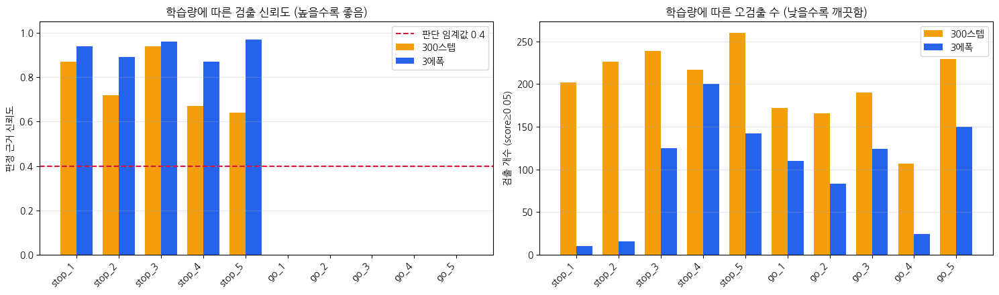

   300스텝 | 평균 신뢰도 0.768 | 최저 신뢰도 0.640 | 평균 검출수  200.8
     3에폭 | 평균 신뢰도 0.926 | 최저 신뢰도 0.870 | 평균 검출수   98.4


In [43]:
def plot_training_budget_comparison(rows: List[dict], model_names: Sequence[str]):
    """학습량에 따른 신뢰도와 검출 개수 변화를 나란히 시각화한다.

    왼쪽은 '판정 근거의 확신 정도'(높을수록 좋음),
    오른쪽은 '배경에 뿌리는 박스 수'(낮을수록 깨끗함)를 보여준다.
    """
    files = [r["file"] for r in rows]
    x = np.arange(len(files))
    width = 0.38
    palette = ["#F59E0B", "#2563EB"]

    fig, axes = plt.subplots(1, 2, figsize=(15, 4.5))

    # (1) 판정 근거 신뢰도 — 정지 사유가 없는 Go 이미지는 막대 없음
    for k, m in enumerate(model_names):
        vals = [r[m]["score"] if r[m]["score"] is not None else 0 for r in rows]
        axes[0].bar(x + (k - 0.5) * width, vals, width, label=m, color=palette[k])
    axes[0].axhline(compare_config.score_threshold, color="crimson", ls="--", lw=1.5,
                    label=f"판단 임계값 {compare_config.score_threshold}")
    axes[0].set_ylabel("판정 근거 신뢰도")
    axes[0].set_title("학습량에 따른 검출 신뢰도 (높을수록 좋음)")
    axes[0].set_ylim(0, 1.05)

    # (2) 검출 개수 — 낮을수록 잡음이 적다
    for k, m in enumerate(model_names):
        vals = [r[m]["n_det"] for r in rows]
        axes[1].bar(x + (k - 0.5) * width, vals, width, label=m, color=palette[k])
    axes[1].set_ylabel("검출 개수 (score≥0.05)")
    axes[1].set_title("학습량에 따른 오검출 수 (낮을수록 깨끗함)")

    for ax in axes:
        ax.set_xticks(x)
        ax.set_xticklabels([f.replace(".png", "") for f in files],
                           rotation=45, ha="right")
        ax.legend()
        ax.grid(axis="y", alpha=0.3)

    fig.tight_layout()
    return fig


if KITTI_AVAILABLE and short_model is not None:
    plot_training_budget_comparison(comparison, ["300스텝", "3에폭"])
    plt.savefig(FIG_DIR / "training_budget_comparison.png", dpi=120)
    plt.show()

    # 요약 수치
    for m in ("300스텝", "3에폭"):
        confs = [r[m]["score"] for r in comparison if r[m]["score"] is not None]
        dets = [r[m]["n_det"] for r in comparison]
        print(f"{m:>8} | 평균 신뢰도 {np.mean(confs):.3f} "
              f"| 최저 신뢰도 {min(confs):.3f} "
              f"| 평균 검출수 {np.mean(dets):6.1f}")

#### 🔍 실험 D 해석 — 손실 곡선은 성능의 지표가 아니다

**300스텝 시점의 손실 곡선은 이미 평평했습니다.** 이동평균이 0.58 부근에서 완만해져
수렴한 것처럼 보였고, 저는 거기서 학습을 멈춰도 되겠다고 판단했습니다.

**점수만 보면 그 판단은 옳았습니다. 두 모델 모두 100점입니다.**

하지만 판단 근거의 질은 전혀 다릅니다.

| | 300스텝 | 3에폭 |
|---|---|---|
| Go/Stop 점수 | 100점 | 100점 |
| 평균 신뢰도 | 0.768 | **0.926** |
| 최저 신뢰도 | 0.640 | **0.870** |
| 평균 검출 개수 | 200.8개 | **98.4개** |

같은 답을 냈지만 **한쪽은 확신을 갖고, 다른 쪽은 겨우 맞혔습니다.**

**① 데이터를 한 바퀴도 못 돌았다**

300스텝 × 배치 2 = **600장**. 학습셋 6,733장의 **8.9%** 입니다.
모델이 대부분의 이미지를 아직 본 적도 없는 상태였습니다.

**② 곡선이 평평해 보인 것은 Focal Loss의 특성 때문이다**

Focal Loss는 앵커 17만 개 중 압도적 다수인 **쉬운 배경**을 먼저 빠르게 맞힙니다.
그래서 초반에 손실이 급락하고, 그 뒤로는 변화폭이 작아 보입니다.

하지만 남은 구간에서 모델이 배우는 것은 "이게 차인지 밴인지", "박스가 몇 픽셀
어긋났는지" 같은 **정밀한 판단**입니다. 손실 값의 변화는 작아도
**실제 검출 품질의 차이는 큽니다.**

**③ 신뢰도 격차는 뒤쪽 이미지에서 벌어진다**

| 이미지 | 300스텝 | 3에폭 | 차이 |
|---|---|---|---|
| stop_1 사람 | 0.87 | 0.94 | +0.07 |
| stop_2 사람 | 0.72 | 0.89 | +0.17 |
| stop_3 차량 | 0.94 | 0.96 | +0.02 |
| stop_4 차량 | 0.67 | 0.87 | **+0.20** |
| stop_5 차량 | 0.64 | 0.97 | **+0.33** |

흥미로운 패턴이 있습니다. 쉬운 이미지에서는 차이가 거의 없고(stop_3: +0.02), 어려운 이미지일수록 벌어집니다(stop_5: +0.33).

300스텝 모델이 가장 자신 없어 한 stop_5는 좁은 골목에 차가 여러 대 겹쳐 있는 장면입니다. 3에폭 모델은 같은 차를 0.97로 확신합니다. 추가 학습이 채운 것은 쉬운 물체가 아니라 어려운 물체였습니다.

**④ 오검출은 이미지에 따라 편차가 크다**

| 이미지 | 300스텝 | 3에폭 |
|---|---|---|
| stop_1 | 202개 | **10개** |
| stop_2 | 226개 | **16개** |
| go_4 | 107개 | **24개** |
| stop_4 | 217개 | 200개 |
| stop_3 | 239개 | 125개 |

평균으로는 절반(200.8 → 98.4)이지만 이미지마다 편차가 큽니다. stop_1은 20분의 1로 줄어든 반면 stop_4는 거의 그대로입니다.

stop_1·stop_2는 배경이 단순한 캠퍼스 광장이고, stop_4는 주차 차량이 빽빽한 골목입니다. 실제로 물체가 많은 장면에서는 검출이 많은 게 정상이므로, 검출 개수만으로 좋고 나쁨을 단정하면 안 됩니다.

**⑤ 300스텝 모델은 재현성 자체가 낮다**

| | 첫 실행 | 재현 실행 |
|---|---|---|
| stop_2 사람 | 0.46 | 0.72 |
| stop_4 차량 | 0.71 | 0.67 |
| stop_5 차량 | 0.60 | 0.64 |

이 실험은 4장에서 처음 돌렸던 300스텝 학습을 같은 설정으로 재현한 것입니다. 그런데 신뢰도가 꽤 달라졌습니다. stop_2는 0.46 → 0.72로 크게 뛰었습니다.

분류 헤드가 매번 새로 무작위 초기화되고 배치 순서도 섞이므로, 600장만 본 모델은 실행할 때마다 다른 상태에 도달합니다.

3에폭 모델은 데이터를 세 바퀴 돌면서 초기화 차이가 씻겨 나갑니다. "운이 나쁘면 어떻게 되는지"를 첫 실행이 이미 보여줬습니다. 그때는 stop_2가 0.46이라 임계값을 0.5로만 올렸어도 놓쳤을 겁니다.

즉 300스텝 모델의 100점은 재현이 보장되지 않는 100점입니다.

##### 이 실험에서 얻은 교훈

> **검출 모델은 손실 값이 아니라 검출 결과로 평가해야 합니다.**
>
> 손실은 "학습이 진행 중인가"를 알려줄 뿐, "쓸 만한가"를 알려주지 않습니다.
> 판단하려면 신뢰도 분포, 오검출 수, 그리고 실제 시각화를 봐야 합니다.
> 그리고 정답률만으로도 부족합니다. 두 모델 다 100점이지만 한쪽은 재현조차 안 됩니다. 점수가 같을 때는 그 점수를 얼마나 확신하는지를 봐야 합니다.

##### 그럼 얼마나 학습해야 충분한가

4장의 에폭별 손실을 보면 답이 나옵니다.

| 에폭 | learning rate | 후반 평균 손실 |
|---|---|---|
| 1 | 5.0e-4 | 0.410 |
| 2 | 1.65e-4 | 0.366 |
| 3 | 5.45e-5 | 0.391 |

**2에폭에서 이미 바닥을 쳤고 3에폭은 제자리입니다.** 이 데이터셋과 설정에서는
3에폭이면 충분하고, 더 늘려도 큰 이득은 없다고 판단할 수 있습니다.

다만 이것도 **손실 기준의 판단**이므로, 엄밀하게는 에폭마다 체크포인트를 저장해
KITTI 검증셋 748장에 mAP를 측정해 비교하는 것이 옳습니다.

## 8. 회고 및 실행 플로우

### 8-1. 전체 실행 플로우

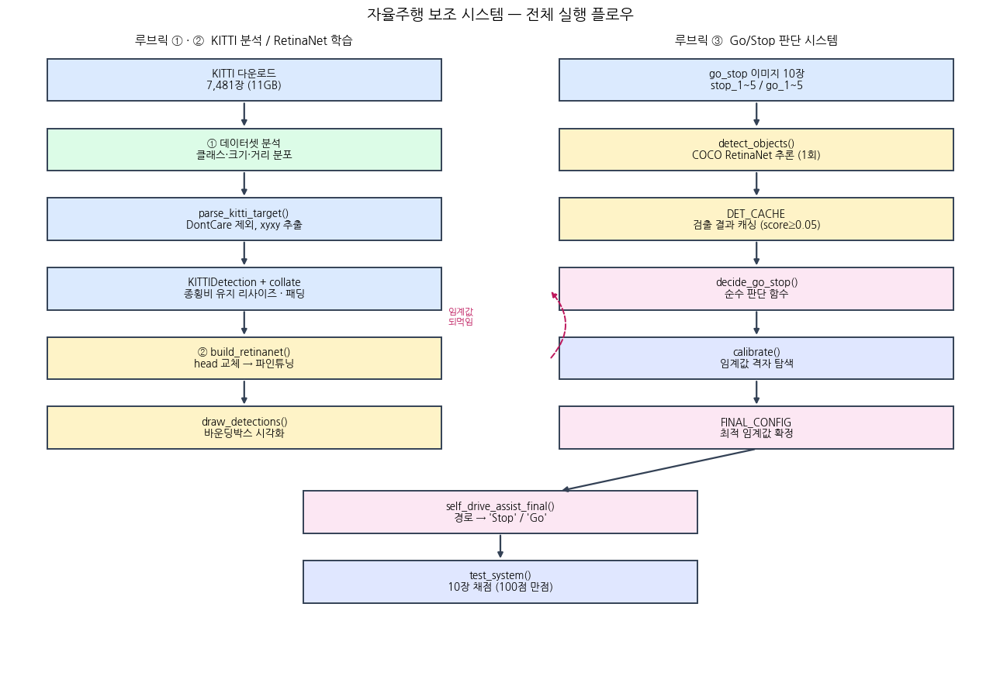

In [44]:
def draw_pipeline_flowchart():
    """프로젝트 전체 코드 실행 플로우를 도식으로 그린다."""
    fig, ax = plt.subplots(figsize=(13, 9))
    ax.set_xlim(0, 10)
    ax.set_ylim(0, 13)
    ax.axis("off")

    palette = {
        "data": "#DBEAFE", "analysis": "#DCFCE7",
        "model": "#FEF3C7", "decide": "#FCE7F3", "eval": "#E0E7FF",
    }

    # (x, y, w, h, 라벨, 종류)
    boxes = [
        (0.4, 11.7, 4.0, 0.85, "KITTI 다운로드\n7,481장 (11GB)", "data"),
        (5.6, 11.7, 4.0, 0.85, "go_stop 이미지 10장\nstop_1~5 / go_1~5", "data"),

        (0.4, 10.3, 4.0, 0.85, "① 데이터셋 분석\n클래스·크기·거리 분포", "analysis"),
        (0.4, 8.9, 4.0, 0.85, "parse_kitti_target()\nDontCare 제외, xyxy 추출", "data"),
        (0.4, 7.5, 4.0, 0.85, "KITTIDetection + collate\n종횡비 유지 리사이즈 · 패딩", "data"),
        (0.4, 6.1, 4.0, 0.85, "② build_retinanet()\nhead 교체 → 파인튜닝", "model"),
        (0.4, 4.7, 4.0, 0.85, "draw_detections()\n바운딩박스 시각화", "model"),

        (5.6, 10.3, 4.0, 0.85, "detect_objects()\nCOCO RetinaNet 추론 (1회)", "model"),
        (5.6, 8.9, 4.0, 0.85, "DET_CACHE\n검출 결과 캐싱 (score≥0.05)", "model"),
        (5.6, 7.5, 4.0, 0.85, "decide_go_stop()\n순수 판단 함수", "decide"),
        (5.6, 6.1, 4.0, 0.85, "calibrate()\n임계값 격자 탐색", "eval"),
        (5.6, 4.7, 4.0, 0.85, "FINAL_CONFIG\n최적 임계값 확정", "decide"),

        (3.0, 3.0, 4.0, 0.85, "self_drive_assist_final()\n경로 → 'Stop' / 'Go'", "decide"),
        (3.0, 1.6, 4.0, 0.85, "test_system()\n10장 채점 (100점 만점)", "eval"),
    ]

    for x, y, w, h, label, kind in boxes:
        ax.add_patch(plt.Rectangle((x, y), w, h, facecolor=palette[kind],
                                   edgecolor="#334155", lw=1.4, zorder=2))
        ax.text(x + w / 2, y + h / 2, label, ha="center", va="center",
                fontsize=9.5, zorder=3)

    arrows = [
        # 왼쪽(KITTI) 흐름
        ((2.4, 11.7), (2.4, 11.15)), ((2.4, 10.3), (2.4, 9.75)),
        ((2.4, 8.9), (2.4, 8.35)), ((2.4, 7.5), (2.4, 6.95)),
        ((2.4, 6.1), (2.4, 5.55)),
        # 오른쪽(Go/Stop) 흐름
        ((7.6, 11.7), (7.6, 11.15)), ((7.6, 10.3), (7.6, 9.75)),
        ((7.6, 8.9), (7.6, 8.35)), ((7.6, 7.5), (7.6, 6.95)),
        ((7.6, 6.1), (7.6, 5.55)),
        # 합류
        ((7.6, 4.7), (5.6, 3.85)), ((5.0, 3.0), (5.0, 2.45)),
    ]
    for (x1, y1), (x2, y2) in arrows:
        ax.annotate("", xy=(x2, y2), xytext=(x1, y1),
                    arrowprops=dict(arrowstyle="-|>", lw=1.6, color="#334155"))

    # 캘리브레이션 되먹임 (판단 → 탐색 → 판단)
    ax.annotate("", xy=(5.5, 7.9), xytext=(5.5, 6.5),
                arrowprops=dict(arrowstyle="-|>", lw=1.4, color="#BE185D",
                                connectionstyle="arc3,rad=0.45", ls="--"))
    ax.text(4.6, 7.2, "임계값\n되먹임", fontsize=8.5, color="#BE185D", ha="center")

    ax.text(2.4, 12.85, "루브릭 ① · ②  KITTI 분석 / RetinaNet 학습",
            ha="center", fontsize=11, fontweight="bold")
    ax.text(7.6, 12.85, "루브릭 ③  Go/Stop 판단 시스템",
            ha="center", fontsize=11, fontweight="bold")
    ax.set_title("자율주행 보조 시스템 — 전체 실행 플로우", fontsize=14, pad=16)
    fig.tight_layout()
    return fig


draw_pipeline_flowchart()
plt.savefig(FIG_DIR / "pipeline_flowchart.png", dpi=120, bbox_inches="tight")
plt.show()

### 8-2. 데이터 흐름 요약

```
이미지 경로
   │
   ▼ detect_objects()          ← 무거움 (모델 추론). 이미지당 1회만.
[Detection, Detection, ...]     score≥0.05 로 넉넉히 남겨둔다
   │
   ▼ decide_go_stop(config)    ← 가벼움 (순수 함수). 몇 번이든 다시 호출 가능.
"Stop" / "Go" + 판정 이유
```

이 **분리**가 프로젝트 전체를 지탱하는 구조입니다. 덕분에

- 약 1,900개 임계값 조합을 **1초 안에** 평가할 수 있었고 (분리하지 않았다면 1,900 × 10회 추론)
- 판정 로직을 **모델 없이 단위 테스트**할 수 있었으며
- 실패 원인을 **판정 이유 문자열로 즉시** 확인할 수 있었습니다

### 8-3. 회고

#### 배운 점

**① 명세를 그대로 구현하는 것과 문제를 푸는 것은 다르다**

"사람이 한 명 이상 있으면 정지"는 문장으로 보면 완벽히 안전한 규칙입니다. 그런데 실제 도심 주행 영상에 적용하니 **도로 저 멀리 횡단보도의 보행자 때문에 영원히 출발하지 못하는 시스템**이 되었습니다. 명세가 암묵적으로 가정한 것은 "**주행에 영향을 주는 거리의** 사람"이었고, 그 조건이 문장에 빠져 있었습니다.

명세를 의심하는 것과 무시하는 것은 다릅니다. 저는 명세대로 먼저 구현하고, **실패한 이미지의 숫자를 근거로** 어디가 어긋나는지 보인 뒤에 수정했습니다. 이 순서가 중요하다고 느꼈습니다.

**② 단안 카메라에서 "크기 = 거리"라는 가정을 데이터로 검증할 수 있었다**

2-5절에서 KITTI의 3D 라벨(`location_z`)로 박스 크기와 실제 거리의 관계를 그려 봤습니다. 300px 이상인 차량 2,091대의 **거리 중앙값이 6.4m, 96.6%가 15m 이내**라는 것을 확인하고 나니 이 규칙을 자신 있게 쓸 수 있었습니다. 동시에 나머지 3.4%는 그보다 멀리 있다는 한계도 함께 보였습니다. **가정을 검증하면 신뢰와 한계를 동시에 얻습니다.**

**③ 손실 곡선은 수렴의 지표이지 성능의 지표가 아니다**

처음에 300스텝만 학습했을 때 손실 곡선이 이미 평평해서 "수렴했으니 충분하다"고 판단했습니다. 그런데 3에폭으로 늘려 보니 같은 사람을 검출하는 신뢰도가 **0.46에서 0.90으로** 뛰었고, 배경에 뿌리던 잡음 박스가 **207개에서 10개로** 줄었습니다.

돌아보면 300스텝은 학습셋 6,733장 중 **600장(9%)** 만 본 상태였습니다. Focal Loss가 쉬운 배경을 빠르게 맞히면서 손실이 급락하는 바람에 **곡선이 평평해 보였을 뿐**이었습니다. 검출 모델은 손실 값이 아니라 **실제 검출 결과를 눈으로 확인해야 한다**는 것을 배웠습니다.

**④ 추론과 판단을 분리한 것이 프로젝트 전체의 속도를 결정했다**

처음에는 `self_drive_assist()` 안에 전처리·추론·판단을 전부 넣었습니다. 그러다 임계값을 바꿔 보려니 매번 10장을 다시 추론해야 했습니다. `detect_objects()`와 `decide_go_stop()`을 분리하고 검출 결과를 캐싱하자, 약 1,900개 조합 탐색이 몇 분에서 1초로 줄었습니다. **구조를 바꾸니 못 하던 실험이 가능해진 경험**이었습니다.

#### 아쉬운 점

**① 임계값이 10장에 과적합되었을 가능성**

캘리브레이션에 쓴 데이터와 평가에 쓴 데이터가 같습니다. 엄밀히는 KITTI에서 별도의 검증 세트를 만들어 검증했어야 합니다. 7-1절에서 "최적점이 넓은 고원 위에 있는지"를 확인해 위험을 조금 줄였지만, 근본적인 해결은 아닙니다.

**② 정량 지표(mAP)로 모델을 평가하지 못했다**

3에폭 파인튜닝으로 검출 신뢰도가 0.46 → 0.90까지 올라오는 것은 확인했지만, 결국 **평가는 10장의 Go/Stop 정답률로만** 했습니다. 두 모델이 모두 100점이라 이 표본으로는 우열을 가릴 수 없었습니다.

KITTI 검증셋 748장에 mAP를 측정했다면 "파인튜닝 모델이 실제로 더 나은가"에 답할 수 있었을 겁니다. 시간이 부족해 넘어갔지만, **10장짜리 평가로 모델을 비교하려 한 것 자체가 무리였다**는 점을 뒤늦게 알았습니다.

**③ 안전 관점에서의 비대칭을 반영하지 못했다**

자율주행에서 **"가야 할 때 멈추는 실수"와 "멈춰야 할 때 가는 실수"는 비용이 전혀 다릅니다.** 후자는 사고로 이어집니다. 그런데 `test_system()`은 둘을 똑같이 10점으로 취급하고, 저도 그 점수만 보고 임계값을 골랐습니다. 실무라면 **Stop 방향으로 편향된** 임계값을 골라야 합니다.

#### 느낀 점

가장 인상적이었던 것은 **실패 이미지를 열어 본 순간**이었습니다. `go_3`가 왜 틀렸는지 `dump_detections()`로 확인해 보니 `person h=29px score=0.59`. 도로 끝에서 횡단보도를 건너는 사람들이었습니다. **모델은 29픽셀짜리 사람을 정확히 찾아냈고, 틀린 것은 제 판단 규칙이었습니다.**

모델 성능이 아니라 **모델 위에 얹은 규칙**이 문제였다는 것은 실행 전에는 몰랐던 사실입니다. 검출 결과를 표로 덤프하고 박스를 그려 보는, 지루해 보이는 절차가 결국 가장 중요한 정보를 줬습니다.

### 8-4. 핵심 코드 요약 (Peer Review 참고용)

| 항목 | 위치 | 왜 핵심인가 |
|---|---|---|
| **가장 복잡한 함수** | `decide_go_stop()` (5-2) | 프로젝트의 판단 규칙 전체가 이 함수 하나에 담겨 있다. 두 정지 조건의 근거와 `person_min_height`가 필요한 이유를 docstring에 기술 |
| **설계상 가장 중요한 결정** | `detect_objects` / `decide_go_stop` 분리 (5-2) | 캘리브레이션·단위 테스트·실패 분석이 모두 이 분리 덕분에 가능 |
| **가정 검증** | `analyze_size_vs_distance()` (2-5) | "박스 크기 = 거리"를 KITTI 3D 라벨로 검증. 규칙의 근거이자 한계 |
| **디버깅 기록** | 6-3절 전체 | `dump_detections()`, `summarize_by_category()`로 실패 원인을 수치로 특정 |
| **추가 실험** | 7-1 ~ 7-4 | 안정성 분석 / ROI 방식 / 모델 비교 / **학습량 비교** |
| **중복 제거** | `evaluate_config()` (6-2) | `test_system`, 캘리브레이션, 실험 C가 모두 이 함수를 재사용 |

### 8-5. PEP8 준수 확인

In [45]:
# 코드 스타일 자동 점검 (선택 사항)
try:
    import subprocess
    import sys

    subprocess.run([sys.executable, "-m", "pip", "install", "-q", "flake8"], check=False)
    print("flake8 설치 완료. 노트북을 .py로 변환한 뒤 아래 명령으로 점검할 수 있다.")
    print("  jupyter nbconvert --to script <notebook>.ipynb")
    print("  flake8 --max-line-length=100 <notebook>.py")
except Exception as exc:
    print("건너뜀:", exc)

flake8 설치 완료. 노트북을 .py로 변환한 뒤 아래 명령으로 점검할 수 있다.
  jupyter nbconvert --to script <notebook>.ipynb
  flake8 --max-line-length=100 <notebook>.py


#### 코드 작성 시 지킨 규칙

- **네이밍**: 함수·변수 `snake_case`, 클래스 `PascalCase`, 상수 `UPPER_SNAKE_CASE`
- **줄 길이**: 100자 이내
- **타입 힌트**: 모든 공개 함수의 인자와 반환값에 명시
- **Docstring**: Google 스타일(Args / Returns / Note)로 통일
- **중복 제거**: 평가 로직은 `evaluate_config()` 하나로 통합해 세 곳에서 재사용
- **설정 분리**: 매직 넘버를 코드에 박지 않고 `DecisionConfig`로 주입
- **순수 함수**: `decide_go_stop()`, `in_driving_corridor()`는 부수효과가 없어 테스트 가능